# Analysis of Bordeaux Airbnb Data

### Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import scipy.stats as stats
import statsmodels.api as sm
import statsmodels.stats.contingency_tables as ct
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.weightstats import ztest
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
from gensim import corpora
from numpy import linalg as LA
from sklearn.preprocessing import LabelEncoder
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import make_regression
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import QuantileTransformer
from sklearn.compose import TransformedTargetRegressor
import nltk
from sklearn.metrics import mean_squared_error
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer,PorterStemmer
from nltk.corpus import stopwords
import re
from utils import *
%matplotlib inline

sns.set_style("whitegrid")
plt.style.use("fivethirtyeight")
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 100)
pd.set_option('display.min_rows', 100)
pd.set_option('display.expand_frame_repr', True)


[nltk_data] Downloading package stopwords to /home/mouad/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /home/mouad/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /home/mouad/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


### Loading the data

In [2]:
df = pd.read_csv("33000-BORDEAUX_nettoye.csv")
display(df.sample(3))

,Identifiant,Url,Titre,PrixNuitee,Latitude,Longitude,Resume,Capacite_accueil,NombreSdB,NbChambres,NbLits,Type_logement,type_propriete,type_lit,Animal_sur_place,Cuisine,Internet,television,produits_base,Shampooing,Chauffage,Climatisation,machine_laver,seche_linge,parking_sur-place,wifi,television_cable,petit_dejeuner,animaux_acceptes,pourEnfants_famille,adapte_evenements,logement_fumeur,accessibilite,Ascenseur,cheminee_interieur,Interphone,Portier,Piscine,Jacuzzi,salle_sport,Entree_24-24,Cintres,fer_repasser,seche_cheveux,espace_travail_ordi,detecteur_fumee,monoxyde_carbone_detect,kit_secours,fiche_securite,extincteur,porte_chambre_verrou,prix_nuitee,rection_semaine,reduction_mois,surcout_voyageur_supp,frais_menage,Caution,conditions_annulation,Description,reglement_interieur,duree_minimale_sejour
1601,6952547,https://www.airbnb.fr/rooms/6952547,Bel appartement spacieux (87m2),55,44.850479,-0.613598,Appartement spacieux refait à neuf l'an passé....,3,5,2,2,Logement entier,Appartement,NaN,Chien(s),1,1,1,1,0,1,0,1,0,1,1,0,0,1,1,0,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,55,14,31,0,0,0,Flexibles,Le logement\n\nPossible d'avoir gratuitement c...,"Si vous êtes fumeurs, je vous demanderais de b...",1
1530,6791767,https://www.airbnb.fr/rooms/6791767,Chambre dans grande maison,30,44.834473,-0.588220,Chambre avec avec lit pour 2 personnes en mezz...,3,1,1,2,Chambre privée,Maison,NaN,Chat(s),0,0,0,1,0,1,1,1,0,0,1,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,30,14,40,12,0,0,Flexibles,Le logement\n\nLa maison est en pierre apparen...,Non fumeur\n\nNe convient pas aux animaux\n\nP...,2
911,4981809,https://www.airbnb.fr/rooms/4981809,Appartement T2 - Centre-ville,50,44.831654,-0.583236,"Deux-pièces, quartier calme en centre-ville. A...",4,1,1,1,Logement entier,Appartement,Vrai lit,NaN,1,0,0,1,0,1,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,1,1,0,1,1,1,0,0,1,0,0,50,15,30,0,0,150,Flexibles,Le logement\n\nAppartement 2 pièces. Séjour av...,Pas de fête ni de soirée\n\nMerci de respecter...,2


In [3]:
print('Number of observations: '+ str(df.shape[0]))
print('Number of variables: '+ str(df.shape[1]))

Number of observations: 5237
Number of variables: 61


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5237 entries, 0 to 5236
Data columns (total 61 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Identifiant              5237 non-null   int64  
 1   Url                      5237 non-null   object 
 2   Titre                    5237 non-null   object 
 3   PrixNuitee               5237 non-null   int64  
 4   Latitude                 5237 non-null   float64
 5   Longitude                5237 non-null   float64
 6   Resume                   5236 non-null   object 
 7   Capacite_accueil         5237 non-null   int64  
 8   NombreSdB                5237 non-null   int64  
 9   NbChambres               5237 non-null   int64  
 10  NbLits                   5237 non-null   int64  
 11  Type_logement            5237 non-null   object 
 12  type_propriete           5237 non-null   object 
 13  type_lit                 2375 non-null   object 
 14  Animal_sur_place        

In [5]:
# Checking for missing values
display(df.isnull().sum())

Identifiant                   0
Url                           0
Titre                         0
PrixNuitee                    0
Latitude                      0
Longitude                     0
Resume                        1
Capacite_accueil              0
NombreSdB                     0
NbChambres                    0
NbLits                        0
Type_logement                 0
type_propriete                0
type_lit                   2862
Animal_sur_place           4847
Cuisine                       0
Internet                      0
television                    0
produits_base                 0
Shampooing                    0
Chauffage                     0
Climatisation                 0
machine_laver                 0
seche_linge                   0
parking_sur-place             0
wifi                          0
television_cable              0
petit_dejeuner                0
animaux_acceptes              0
pourEnfants_famille           0
adapte_evenements             0
logement

In [6]:
for column in df.columns:
    if df[column].isnull().sum() != 0:
        print("=======================================================")
        print(f"{column} ==> Missing Values : {df[column].isnull().sum()}, dtypes : {df[column].dtypes}")

Resume ==> Missing Values : 1, dtypes : object
type_lit ==> Missing Values : 2862, dtypes : object
Animal_sur_place ==> Missing Values : 4847, dtypes : object
conditions_annulation ==> Missing Values : 965, dtypes : object
Description ==> Missing Values : 4, dtypes : object
reglement_interieur ==> Missing Values : 862, dtypes : object


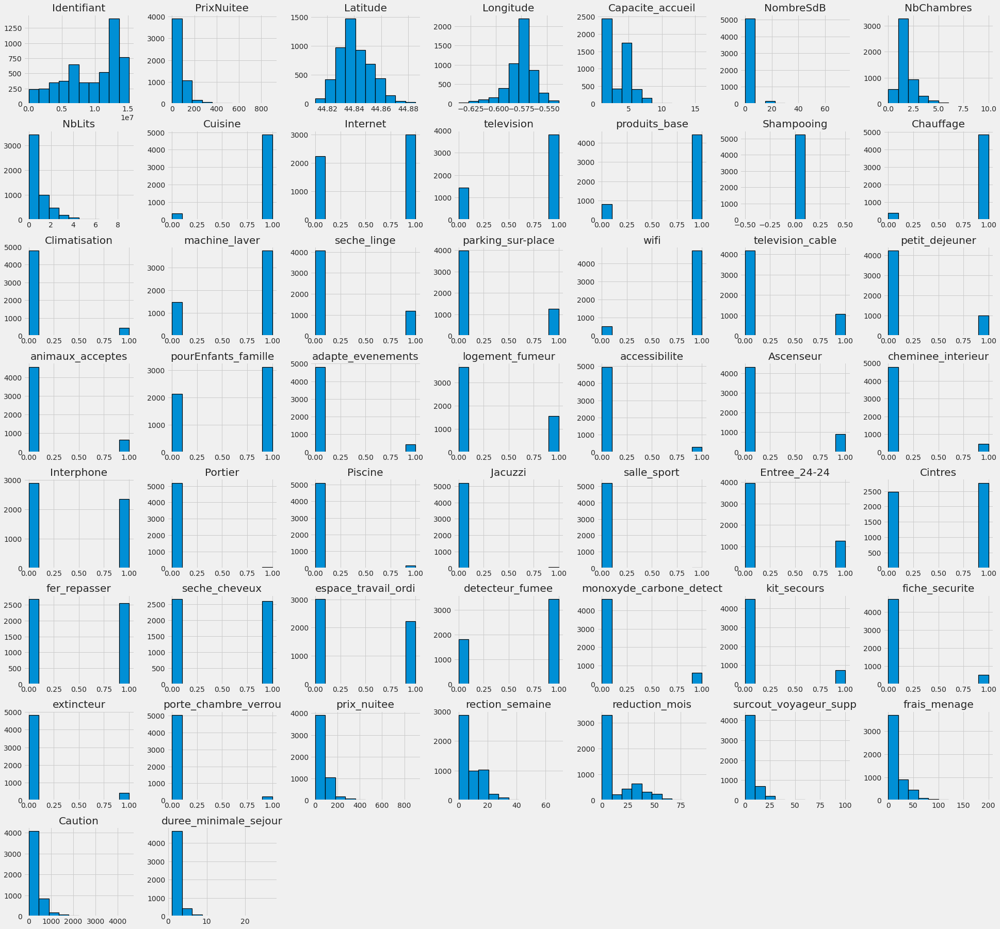

In [7]:
# Visualizing the distribution for every "feature"
df.hist(edgecolor="black", linewidth=1.2, figsize=(30, 30));

<AxesSubplot:title={'center':"Zoom sur l'histogramme"}, xlabel='prix de la nuit'>

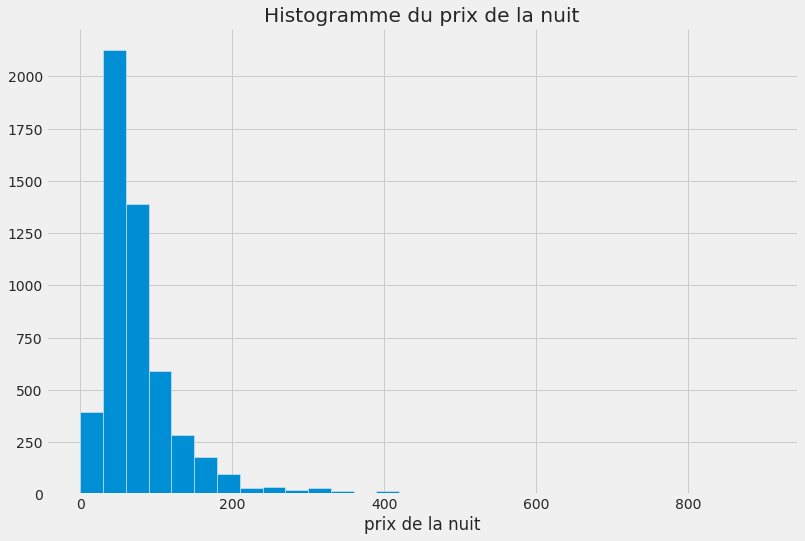

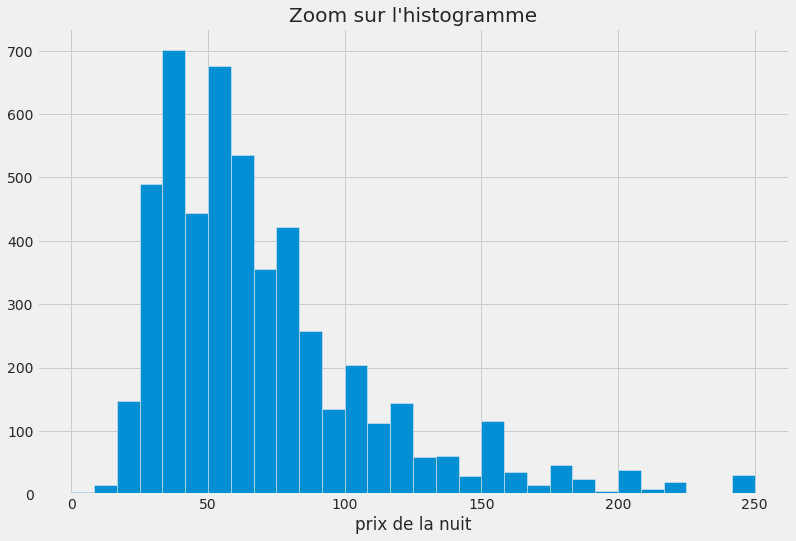

In [8]:
plt.figure(figsize=(12, 8))
plt.title('Histogramme du prix de la nuit')
plt.xlabel('prix de la nuit')
df.PrixNuitee.hist(bins=30)
plt.figure(figsize=(12, 8))
plt.title("Zoom sur l'histogramme")
plt.xlabel('prix de la nuit')
df.PrixNuitee[df.PrixNuitee < 260].hist(bins=30)

In [9]:
print(f"Prix moyen par nuit : {df.PrixNuitee.mean():.2f} €")
print(f"Prix maximum par nuit : {df.PrixNuitee.max()} €")
print(f"Prix minimum par nuit : {df.PrixNuitee.min()} €")

Prix moyen par nuit : 76.24 €
Prix maximum par nuit : 900 €
Prix minimum par nuit : 0 €


In [10]:
df[df.PrixNuitee == 0]

,Identifiant,Url,Titre,PrixNuitee,Latitude,Longitude,Resume,Capacite_accueil,NombreSdB,NbChambres,NbLits,Type_logement,type_propriete,type_lit,Animal_sur_place,Cuisine,Internet,television,produits_base,Shampooing,Chauffage,Climatisation,machine_laver,seche_linge,parking_sur-place,wifi,television_cable,petit_dejeuner,animaux_acceptes,pourEnfants_famille,adapte_evenements,logement_fumeur,accessibilite,Ascenseur,cheminee_interieur,Interphone,Portier,Piscine,Jacuzzi,salle_sport,Entree_24-24,Cintres,fer_repasser,seche_cheveux,espace_travail_ordi,detecteur_fumee,monoxyde_carbone_detect,kit_secours,fiche_securite,extincteur,porte_chambre_verrou,prix_nuitee,rection_semaine,reduction_mois,surcout_voyageur_supp,frais_menage,Caution,conditions_annulation,Description,reglement_interieur,duree_minimale_sejour
4327,13507580,https://www.airbnb.fr/rooms/13507580,Bel appartement de 45m² au cœur de Bordeaux,0,44.832659,-0.565469,A seulement 10 min du centre-ville de Bordeaux...,4,1,1,0,Logement entier,Appartement,NaN,NaN,1,0,0,0,0,1,0,0,0,0,1,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,5,0,0,NaN,NaN,NaN,2
4416,13594315,https://www.airbnb.fr/rooms/13594315,Echoppe ensoleillée,0,44.852209,-0.586533,"Mon logement est proche de le centre ville, pa...",2,1,1,0,Chambre privée,Maison,NaN,NaN,1,0,1,1,0,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,45,20,300,Flexibles,NaN,NaN,1
5111,14854384,https://www.airbnb.fr/rooms/14854384,Chambre cozy dans l'hyper centre,0,44.839525,-0.574569,"Mon logement est proche de parcs, la vue excep...",2,1,1,0,Chambre privée,Appartement,Vrai lit,NaN,1,1,1,1,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,1,1,1,1,0,0,1,0,0,0,0,0,0,0,10,100,NaN,NaN,NaN,1


Wow, il y a des maisons gratuites

In [11]:
df = df[df['PrixNuitee']!=0]

In [12]:
#to make the interactive maps
import folium
from folium.plugins import FastMarkerCluster

lats2018 = df['Latitude'].tolist()
lons2018 = df['Longitude'].tolist()
locations = list(zip(lats2018, lons2018))

map1 = folium.Map(location=[44.8350, -0.5800], zoom_start=12.5)
FastMarkerCluster(data=locations).add_to(map1)
map1

In [13]:
print("Type_logement : ",df.Type_logement.unique())
print("type_lit : ",df.type_lit.unique())
print("type_propriete : ",df.type_propriete.unique())

Type_logement :  ['Chambre privée' 'Logement entier' 'Chambre partagée']
type_lit :  [nan 'Vrai lit' 'Canapé convertible' 'Canapé']
type_propriete :  ['Maison' 'Appartement' 'Bed & Breakfast' 'Maison de ville' 'Loft'
 'Cabane' 'Appartement en résidence' 'Bungalow' 'Inconnue'
 'Maison écologique' 'Villa' 'Dortoir' 'Autre']


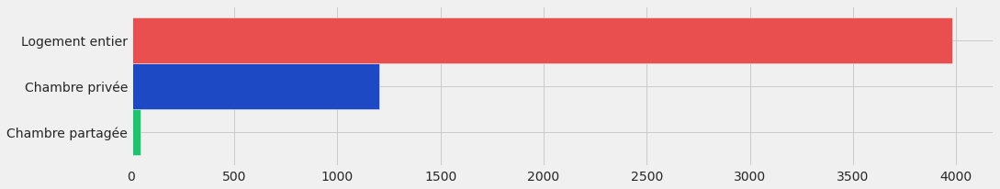

In [14]:
freq = df['Type_logement'].value_counts().sort_values(ascending=True)
freq.plot.barh(figsize=(15, 3), width=1, color = ["#1dc46e","#1d49c4","#ea4f4f"])
plt.show()

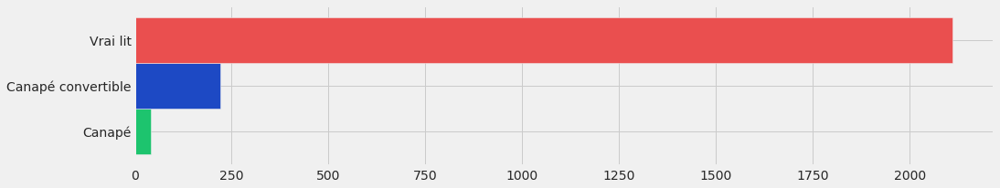

In [15]:
freq = df['type_lit'].value_counts().sort_values(ascending=True)
freq.plot.barh(figsize=(15, 3), width=1, color = ["#1dc46e","#1d49c4","#ea4f4f"])
plt.show()

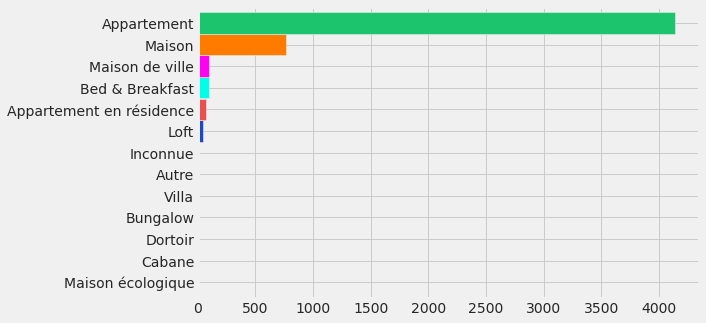

In [16]:
freq = df['type_propriete'].value_counts().sort_values(ascending=True)
freq.plot.barh(figsize=(8, 5), width=1, color = ["#1dc46e","#1d49c4","#ea4f4f","#00ffe9","#ff00f2","#ff7b00"])
plt.show()

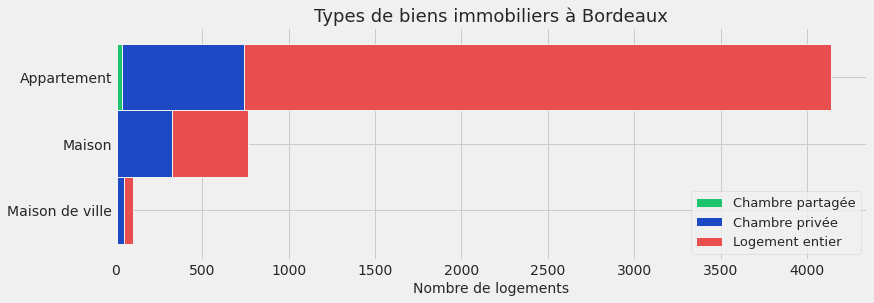

In [17]:
prop = df.groupby(['type_propriete','Type_logement']).Type_logement.count()
prop = prop.unstack()
prop['total'] = prop.iloc[:,0:3].sum(axis = 1)
prop = prop.sort_values(by=['total'])
prop = prop[prop['total']>=100]
prop = prop.drop(columns=['total'])

prop.plot(kind='barh',stacked=True, color = ["#1dc46e","#1d49c4","#ea4f4f"],
              linewidth = 1, grid=True, figsize=(12,4), width=1)
plt.title('Types de biens immobiliers à Bordeaux', fontsize=18)
plt.xlabel('Nombre de logements', fontsize=14)
plt.ylabel("")
plt.legend(loc = 4,prop = {"size" : 13})
plt.rc('ytick', labelsize=13)
plt.show()

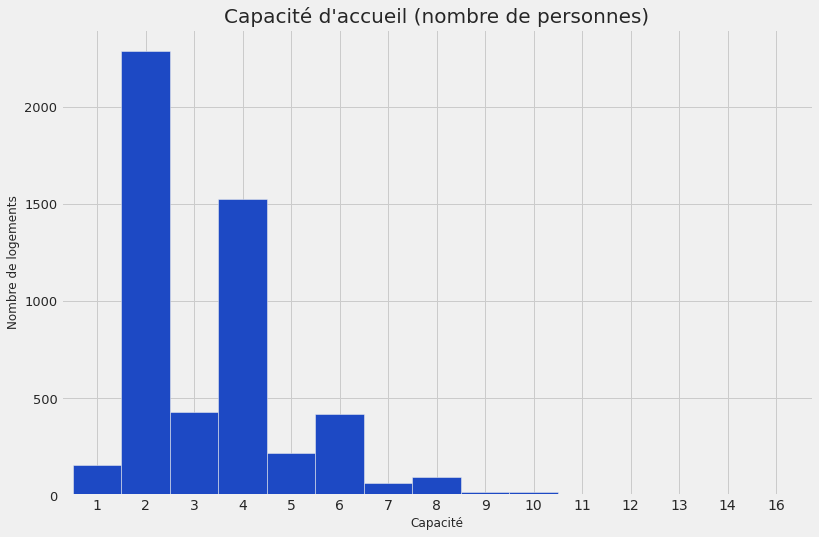

In [18]:
feq=df['Capacite_accueil'].value_counts().sort_index()
feq.plot.bar(figsize=(12, 8), color='#1d49c4', width=1, rot=0)
plt.title("Capacité d'accueil (nombre de personnes)", fontsize=20)
plt.ylabel('Nombre de logements', fontsize=12)
plt.xlabel('Capacité', fontsize=12)
plt.show()

## Factors defining the price :

In [19]:
df.columns

Index(['Identifiant', 'Url', 'Titre', 'PrixNuitee', 'Latitude', 'Longitude',
       'Resume', 'Capacite_accueil', 'NombreSdB', 'NbChambres', 'NbLits',
       'Type_logement', 'type_propriete', 'type_lit', 'Animal_sur_place',
       'Cuisine', 'Internet', 'television', 'produits_base', 'Shampooing',
       'Chauffage', 'Climatisation', 'machine_laver', 'seche_linge',
       'parking_sur-place', 'wifi', 'television_cable', 'petit_dejeuner',
       'animaux_acceptes', 'pourEnfants_famille', 'adapte_evenements',
       'logement_fumeur', 'accessibilite', 'Ascenseur', 'cheminee_interieur',
       'Interphone', 'Portier', 'Piscine', 'Jacuzzi', 'salle_sport',
       'Entree_24-24', 'Cintres', 'fer_repasser', 'seche_cheveux',
       'espace_travail_ordi', 'detecteur_fumee', 'monoxyde_carbone_detect',
       'kit_secours', 'fiche_securite', 'extincteur', 'porte_chambre_verrou',
       'prix_nuitee', 'rection_semaine', 'reduction_mois',
       'surcout_voyageur_supp', 'frais_menage', 'Caution',


### Numeric Data

In [20]:
df_N = df.loc[:,df.dtypes!=np.object]

<ipython-input-20-5feecf6cec31>:1: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  df_N = df.loc[:,df.dtypes!=np.object]


In [21]:
df_N

,Identifiant,PrixNuitee,Latitude,Longitude,Capacite_accueil,NombreSdB,NbChambres,NbLits,Cuisine,Internet,television,produits_base,Shampooing,Chauffage,Climatisation,machine_laver,seche_linge,parking_sur-place,wifi,television_cable,petit_dejeuner,animaux_acceptes,pourEnfants_famille,adapte_evenements,logement_fumeur,accessibilite,Ascenseur,cheminee_interieur,Interphone,Portier,Piscine,Jacuzzi,salle_sport,Entree_24-24,Cintres,fer_repasser,seche_cheveux,espace_travail_ordi,detecteur_fumee,monoxyde_carbone_detect,kit_secours,fiche_securite,extincteur,porte_chambre_verrou,prix_nuitee,rection_semaine,reduction_mois,surcout_voyageur_supp,frais_menage,Caution,duree_minimale_sejour
0,28925,25,44.849101,-0.593501,2,2,1,0,1,1,1,1,0,1,0,1,1,0,1,0,1,1,1,0,1,0,0,1,0,0,0,0,0,1,1,1,1,1,0,0,0,0,0,0,25,5,35,25,23,400,1
1,40151,71,44.856533,-0.574601,2,1,1,0,1,1,1,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,1,1,1,1,1,1,0,0,0,0,71,30,42,0,10,0,3
2,185534,75,44.830634,-0.593309,2,3,1,0,0,0,1,0,0,1,1,1,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,75,0,0,0,0,0,1
3,222887,155,44.836383,-0.566032,4,15,2,0,1,1,1,1,0,1,0,1,0,0,1,1,0,0,1,0,0,0,1,0,1,0,0,0,0,1,1,1,1,1,1,1,0,0,0,0,155,20,30,0,100,200,3
4,286581,80,44.837695,-0.573713,4,1,1,0,1,1,1,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,80,15,35,10,0,400,1
5,315524,120,44.839047,-0.568513,2,1,1,0,1,1,0,0,0,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,120,15,50,0,80,200,3
6,317273,140,44.847342,-0.580340,3,15,1,0,1,1,0,1,0,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,1,1,1,1,1,0,0,0,0,140,0,41,10,80,200,3
7,317658,159,44.838148,-0.569889,6,15,2,0,1,1,1,1,0,1,0,1,0,0,1,1,0,0,1,0,0,0,1,0,1,0,0,0,0,1,1,1,1,1,1,1,0,0,0,0,159,15,50,10,100,200,3
8,333031,55,44.842669,-0.576564,3,1,0,0,1,0,1,1,0,1,1,1,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,55,4,5,10,10,200,1
9,333357,155,44.840296,-0.588328,2,1,1,0,0,0,1,0,0,1,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,155,17,0,0,0,0,1


In [22]:
df_N = df_N.drop(columns=['Identifiant','Latitude','Longitude'])

In [23]:
#df_N = remove_outlayers('PrixNuitee',df_N)
#df_N = remove_outlayers('',df_N)

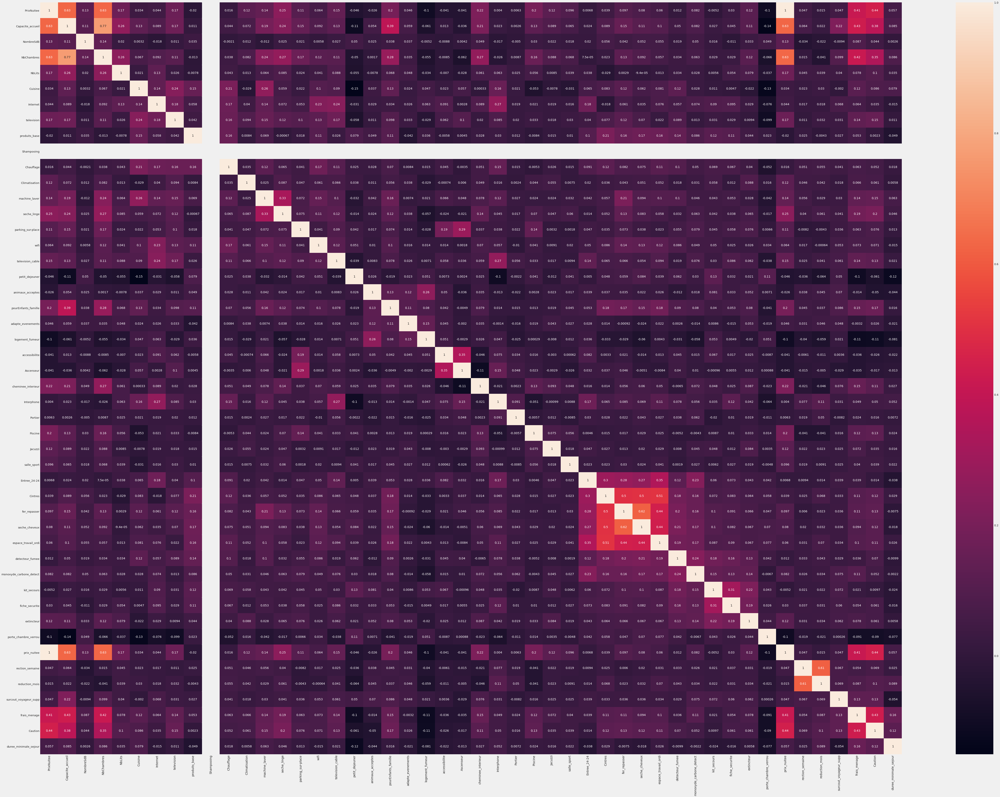

In [24]:
corr_df = df_N.corr(method='pearson')

plt.figure(figsize=(80, 60))
sns.heatmap(corr_df, annot=True)
plt.show()

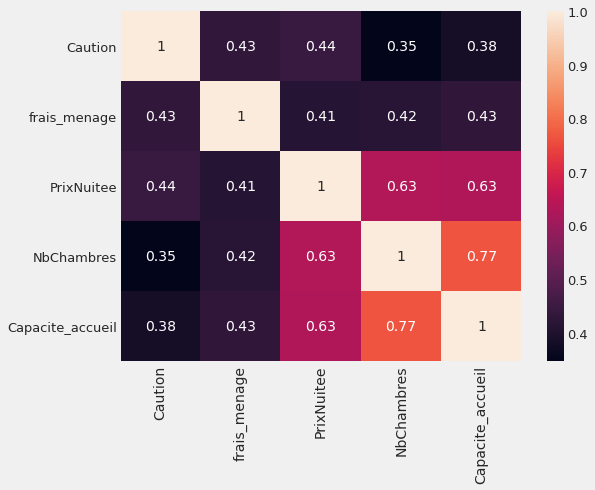

In [25]:
#L = ["Caution", "frais_menage", "NbChambres","Capacite_accueil"]

#df_N = remove_outlayers('Capacite_accueil',df_N)
#df_N = remove_outlayers('frais_menage',df_N)
#df_N = remove_outlayers('NbChambres',df_N)
#df_N = remove_outlayers('Caution',df_N)

corr_df_2 = df_N[["Caution", "frais_menage","PrixNuitee", "NbChambres","Capacite_accueil"]].corr(method='pearson')

plt.figure(figsize=(8, 6))
sns.heatmap(corr_df_2, annot=True)
plt.show()

### PrixNuitee & Capacite_acceuil

In [26]:
fig = px.scatter(df_N, y="PrixNuitee", x="Capacite_accueil", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")
fig.show()

In [27]:
fig = px.box(df_N, x="Capacite_accueil", y="PrixNuitee")
fig.show()

### PrixNuitee & NbChambres

In [28]:
fig = px.scatter(df_N, y="PrixNuitee", x="NbChambres", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")
fig.show()

In [29]:
fig = px.box(df_N, x="NbChambres", y="PrixNuitee")
fig.show()

### PrixNuitee & Caution / Frais Menage 

In [30]:
fig = px.scatter(df_N, y="PrixNuitee", x="Caution", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")
fig.show()

In [31]:
fig = px.scatter(df_N, y="PrixNuitee", x="frais_menage", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")
fig.show()

In [32]:
fig = px.scatter(df_N, x="PrixNuitee", y="frais_menage")
fig.show()

In [33]:
fig = px.scatter(df_N, x="PrixNuitee", y="Caution")
fig.show()

> PrixNuitee depend on Number of rooms and Capacity (Numeric Variables)

## Categorical Data :

In [34]:
df_C = df.loc[:,df.dtypes==np.object]
#df_C = df_C[['Type_logement','type_propriete','type_lit','Animal_sur_place','conditions_annulation']]
df_C

<ipython-input-34-1986af91c844>:1: DeprecationWarning:

`np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



,Url,Titre,Resume,Type_logement,type_propriete,type_lit,Animal_sur_place,conditions_annulation,Description,reglement_interieur
0,https://www.airbnb.fr/rooms/28925,4 chambres dans Bordeaux centre,J'habite une grande maison que je partage tout...,Chambre privée,Maison,NaN,Chien(s),NaN,"Le logement\n\nWe speak english, wir sprechen ...",Notre maison est un lieu familial donc vivant ...
1,https://www.airbnb.fr/rooms/40151,Sunny flat aux Chartrons,"Situé dans le quartier des Chartrons, cet appa...",Logement entier,Appartement,Vrai lit,NaN,Modérées,Le logement\n\nSitué dans le quartier des Char...,L'appartement est non fumeur.\n\nVous pouvez n...
2,https://www.airbnb.fr/rooms/185534,L'Echoppe des Bouilles,L’Échoppe des Bouilles est une maison typique ...,Chambre privée,Maison,Vrai lit,NaN,Strictes,Le logement\n\nL’Échoppe des Bouilles est une ...,L'entrée dans les lieux se fait après 16:00\n\n
3,https://www.airbnb.fr/rooms/222887,Terrace with spectacular view,Bordeaux Terrace is a two bedroom apartment in...,Logement entier,Appartement,NaN,NaN,Modérées,Bordeaux Terrace is a two bedroom apartment in...,L'entrée dans les lieux se fait après 15:00\n\...
4,https://www.airbnb.fr/rooms/286581,Appartement charme bordeaux centre,Appartement avec beaucoup de cachet de 45m2 da...,Logement entier,Appartement,NaN,NaN,Modérées,Le logement\n\nAppartement avec beaucoup de ca...,Ne convient pas aux animaux\n\nPas de fête ni ...
5,https://www.airbnb.fr/rooms/315524,Elegant 1 bd with amazing views,Spacious one bedroom apartment in the historic...,Logement entier,Appartement,Vrai lit,NaN,Modérées,Spacious one bedroom apartment in the historic...,L'entrée dans les lieux se fait après 15:00\n\...
6,https://www.airbnb.fr/rooms/317273,Large,"This spacious one bedroom apartment (1,002 sq ...",Logement entier,Appartement,NaN,NaN,Strictes,"This spacious one bedroom apartment (1,002 sq ...",L'entrée dans les lieux se fait après 14:00\n\...
7,https://www.airbnb.fr/rooms/317658,Fairytale view in historic heart - 2 bd + elev...,"Situated in the heart of the historic city, wi...",Logement entier,Appartement,NaN,NaN,Modérées,"Situated in the heart of the historic city, wi...",Non fumeur\n\nNe convient pas aux animaux\n\nP...
8,https://www.airbnb.fr/rooms/333031,STUDIO BORDEAUX TRIANGLE D OR *****,Venez découvrir Bordeaux et passer quelques jo...,Logement entier,Appartement,Vrai lit,NaN,Strictes,Le logement\n\nVous trouverez vite vos repères...,Non fumeur\n\nPas de fête ni de soirée\n\nNe c...
9,https://www.airbnb.fr/rooms/333357,Suite New-York,Bordelais et professionnels de la restauration...,Chambre privée,Bed & Breakfast,NaN,NaN,Strictes,Le logement\n\nBordelais et professionnels de ...,L'entrée dans les lieux se fait après 17:00\n\...


In [35]:
df_C['PrixNuitee']= df_N['PrixNuitee']
df_C['NbChambres']= df_N['NbChambres']
df_C['Capacite_accueil']= df_N['Capacite_accueil']
df_C.describe()

<ipython-input-35-073f9c5ae921>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-35-073f9c5ae921>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-35-073f9c5ae921>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,PrixNuitee,NbChambres,Capacite_accueil
count,5234.000000,5234.000000,5234.000000
mean,76.286779,1.294230,3.327092
std,62.869623,0.897891,1.686947
min,12.000000,0.000000,1.000000
25%,40.000000,1.000000,2.000000
50%,60.000000,1.000000,3.000000
75%,90.000000,2.000000,4.000000
max,900.000000,10.000000,16.000000


In [36]:
df_C.Animal_sur_place.unique()

array(['Chien(s)', nan, 'Certains animaux', 'Chat(s)', 'Autres animaux',
       'Chien(s) et Chat(s)', 'Chat(s) et Autres animaux',
       'Chien(s) et Autres animaux'], dtype=object)

In [37]:
df_C['Animal_sur_place']=df_C['Animal_sur_place'].fillna('Aucun')

<ipython-input-37-7cbd33d8887f>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [38]:
df_C.type_lit.unique()

array([nan, 'Vrai lit', 'Canapé convertible', 'Canapé'], dtype=object)

In [39]:
df_C = fill_Nan('type_lit',df_C,'Aucun')

/home/mouad/Projet_Big_Data/Project Files/utils.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [40]:
df_C = df_C.dropna()

In [41]:
df_C

,Url,Titre,Resume,Type_logement,type_propriete,type_lit,Animal_sur_place,conditions_annulation,Description,reglement_interieur,PrixNuitee,NbChambres,Capacite_accueil
1,https://www.airbnb.fr/rooms/40151,Sunny flat aux Chartrons,"Situé dans le quartier des Chartrons, cet appa...",Logement entier,Appartement,Vrai lit,Aucun,Modérées,Le logement\n\nSitué dans le quartier des Char...,L'appartement est non fumeur.\n\nVous pouvez n...,71,1,2
2,https://www.airbnb.fr/rooms/185534,L'Echoppe des Bouilles,L’Échoppe des Bouilles est une maison typique ...,Chambre privée,Maison,Vrai lit,Aucun,Strictes,Le logement\n\nL’Échoppe des Bouilles est une ...,L'entrée dans les lieux se fait après 16:00\n\n,75,1,2
3,https://www.airbnb.fr/rooms/222887,Terrace with spectacular view,Bordeaux Terrace is a two bedroom apartment in...,Logement entier,Appartement,Aucun,Aucun,Modérées,Bordeaux Terrace is a two bedroom apartment in...,L'entrée dans les lieux se fait après 15:00\n\...,155,2,4
4,https://www.airbnb.fr/rooms/286581,Appartement charme bordeaux centre,Appartement avec beaucoup de cachet de 45m2 da...,Logement entier,Appartement,Aucun,Aucun,Modérées,Le logement\n\nAppartement avec beaucoup de ca...,Ne convient pas aux animaux\n\nPas de fête ni ...,80,1,4
5,https://www.airbnb.fr/rooms/315524,Elegant 1 bd with amazing views,Spacious one bedroom apartment in the historic...,Logement entier,Appartement,Vrai lit,Aucun,Modérées,Spacious one bedroom apartment in the historic...,L'entrée dans les lieux se fait après 15:00\n\...,120,1,2
6,https://www.airbnb.fr/rooms/317273,Large,"This spacious one bedroom apartment (1,002 sq ...",Logement entier,Appartement,Aucun,Aucun,Strictes,"This spacious one bedroom apartment (1,002 sq ...",L'entrée dans les lieux se fait après 14:00\n\...,140,1,3
7,https://www.airbnb.fr/rooms/317658,Fairytale view in historic heart - 2 bd + elev...,"Situated in the heart of the historic city, wi...",Logement entier,Appartement,Aucun,Aucun,Modérées,"Situated in the heart of the historic city, wi...",Non fumeur\n\nNe convient pas aux animaux\n\nP...,159,2,6
8,https://www.airbnb.fr/rooms/333031,STUDIO BORDEAUX TRIANGLE D OR *****,Venez découvrir Bordeaux et passer quelques jo...,Logement entier,Appartement,Vrai lit,Aucun,Strictes,Le logement\n\nVous trouverez vite vos repères...,Non fumeur\n\nPas de fête ni de soirée\n\nNe c...,55,0,3
9,https://www.airbnb.fr/rooms/333357,Suite New-York,Bordelais et professionnels de la restauration...,Chambre privée,Bed & Breakfast,Aucun,Aucun,Strictes,Le logement\n\nBordelais et professionnels de ...,L'entrée dans les lieux se fait après 17:00\n\...,155,1,2
10,https://www.airbnb.fr/rooms/333932,Suite-Bois Flotté,Suite Bois FlottéBordelais et professionnels d...,Chambre privée,Bed & Breakfast,Vrai lit,Aucun,Strictes,Le logement\n\nSuite Bois FlottéBordelais et p...,L'entrée dans les lieux se fait après 16:00\n\...,145,1,2


In [42]:
fig = px.sunburst(df_C, path=['type_propriete','Type_logement','type_lit','conditions_annulation','Animal_sur_place'], values='PrixNuitee',
                  color='PrixNuitee', hover_data=['PrixNuitee'],
                  color_continuous_scale='twilight',
                  color_continuous_midpoint=np.average(df_C['PrixNuitee']))
fig.show()

### PrixNuitee & Type_Propriete 

In [43]:
#dfC1
dfC1 = df_C.groupby('type_propriete')['PrixNuitee'].agg(['mean','count'])
dfC1=dfC1.drop(['Autre', 'Inconnue'], axis=0)

In [44]:
fig = px.bar(dfC1.sort_values(['count']), x=dfC1.sort_values(['count']).index, y='count')
fig.show()

In [45]:
fig = px.bar(dfC1.sort_values(['mean']), x=dfC1.sort_values(['mean']).index, y='mean')
fig.show()

### PrixNuitee & Type_Logement

In [46]:
dfC1 = df_C.groupby('Type_logement')['PrixNuitee'].agg(['mean','count'])
dfC1

,mean,count
Type_logement,,
Chambre partagée,26.136364,22
Chambre privée,47.891391,755
Logement entier,87.759884,2757


In [47]:
fig = px.bar(dfC1.sort_values(['count']), x=dfC1.sort_values(['count']).index, y='count')
fig.show()

In [48]:
fig = px.bar(dfC1.sort_values(['mean']), x=dfC1.sort_values(['mean']).index, y='mean')
fig.show()

## Textual variables :

### Description

In [49]:
df_C = df_C.drop(['Url'],axis=1)

In [50]:
df_C

,Titre,Resume,Type_logement,type_propriete,type_lit,Animal_sur_place,conditions_annulation,Description,reglement_interieur,PrixNuitee,NbChambres,Capacite_accueil
1,Sunny flat aux Chartrons,"Situé dans le quartier des Chartrons, cet appa...",Logement entier,Appartement,Vrai lit,Aucun,Modérées,Le logement\n\nSitué dans le quartier des Char...,L'appartement est non fumeur.\n\nVous pouvez n...,71,1,2
2,L'Echoppe des Bouilles,L’Échoppe des Bouilles est une maison typique ...,Chambre privée,Maison,Vrai lit,Aucun,Strictes,Le logement\n\nL’Échoppe des Bouilles est une ...,L'entrée dans les lieux se fait après 16:00\n\n,75,1,2
3,Terrace with spectacular view,Bordeaux Terrace is a two bedroom apartment in...,Logement entier,Appartement,Aucun,Aucun,Modérées,Bordeaux Terrace is a two bedroom apartment in...,L'entrée dans les lieux se fait après 15:00\n\...,155,2,4
4,Appartement charme bordeaux centre,Appartement avec beaucoup de cachet de 45m2 da...,Logement entier,Appartement,Aucun,Aucun,Modérées,Le logement\n\nAppartement avec beaucoup de ca...,Ne convient pas aux animaux\n\nPas de fête ni ...,80,1,4
5,Elegant 1 bd with amazing views,Spacious one bedroom apartment in the historic...,Logement entier,Appartement,Vrai lit,Aucun,Modérées,Spacious one bedroom apartment in the historic...,L'entrée dans les lieux se fait après 15:00\n\...,120,1,2
6,Large,"This spacious one bedroom apartment (1,002 sq ...",Logement entier,Appartement,Aucun,Aucun,Strictes,"This spacious one bedroom apartment (1,002 sq ...",L'entrée dans les lieux se fait après 14:00\n\...,140,1,3
7,Fairytale view in historic heart - 2 bd + elev...,"Situated in the heart of the historic city, wi...",Logement entier,Appartement,Aucun,Aucun,Modérées,"Situated in the heart of the historic city, wi...",Non fumeur\n\nNe convient pas aux animaux\n\nP...,159,2,6
8,STUDIO BORDEAUX TRIANGLE D OR *****,Venez découvrir Bordeaux et passer quelques jo...,Logement entier,Appartement,Vrai lit,Aucun,Strictes,Le logement\n\nVous trouverez vite vos repères...,Non fumeur\n\nPas de fête ni de soirée\n\nNe c...,55,0,3
9,Suite New-York,Bordelais et professionnels de la restauration...,Chambre privée,Bed & Breakfast,Aucun,Aucun,Strictes,Le logement\n\nBordelais et professionnels de ...,L'entrée dans les lieux se fait après 17:00\n\...,155,1,2
10,Suite-Bois Flotté,Suite Bois FlottéBordelais et professionnels d...,Chambre privée,Bed & Breakfast,Vrai lit,Aucun,Strictes,Le logement\n\nSuite Bois FlottéBordelais et p...,L'entrée dans les lieux se fait après 16:00\n\...,145,1,2


In [51]:
#df_C.Resume.iloc[0]

In [52]:
df_C = df_C.drop(['Resume'],axis =1)

In [53]:
df_T = df_C[['Titre','Description','reglement_interieur','PrixNuitee']]
df_T

,Titre,Description,reglement_interieur,PrixNuitee
1,Sunny flat aux Chartrons,Le logement\n\nSitué dans le quartier des Char...,L'appartement est non fumeur.\n\nVous pouvez n...,71
2,L'Echoppe des Bouilles,Le logement\n\nL’Échoppe des Bouilles est une ...,L'entrée dans les lieux se fait après 16:00\n\n,75
3,Terrace with spectacular view,Bordeaux Terrace is a two bedroom apartment in...,L'entrée dans les lieux se fait après 15:00\n\...,155
4,Appartement charme bordeaux centre,Le logement\n\nAppartement avec beaucoup de ca...,Ne convient pas aux animaux\n\nPas de fête ni ...,80
5,Elegant 1 bd with amazing views,Spacious one bedroom apartment in the historic...,L'entrée dans les lieux se fait après 15:00\n\...,120
6,Large,"This spacious one bedroom apartment (1,002 sq ...",L'entrée dans les lieux se fait après 14:00\n\...,140
7,Fairytale view in historic heart - 2 bd + elev...,"Situated in the heart of the historic city, wi...",Non fumeur\n\nNe convient pas aux animaux\n\nP...,159
8,STUDIO BORDEAUX TRIANGLE D OR *****,Le logement\n\nVous trouverez vite vos repères...,Non fumeur\n\nPas de fête ni de soirée\n\nNe c...,55
9,Suite New-York,Le logement\n\nBordelais et professionnels de ...,L'entrée dans les lieux se fait après 17:00\n\...,155
10,Suite-Bois Flotté,Le logement\n\nSuite Bois FlottéBordelais et p...,L'entrée dans les lieux se fait après 16:00\n\...,145


In [54]:
df_T['Desc_pre']=df_T['Description'].map(lambda s:preprocess(s)) 
df_T['Reg_pre']=df_T['reglement_interieur'].map(lambda s:preprocess(s)) 
df_T['Titre_pre']=df_T['Titre'].map(lambda s:preprocess(s)) 

<ipython-input-54-e8c7a5cd2b8e>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-54-e8c7a5cd2b8e>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-54-e8c7a5cd2b8e>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [55]:
#df_T['Desc_pre'].iloc[0]

In [56]:
#df_T.to_csv('Df_T.csv')
#df_T = pd.read_csv('Df_T.csv')

<AxesSubplot:>

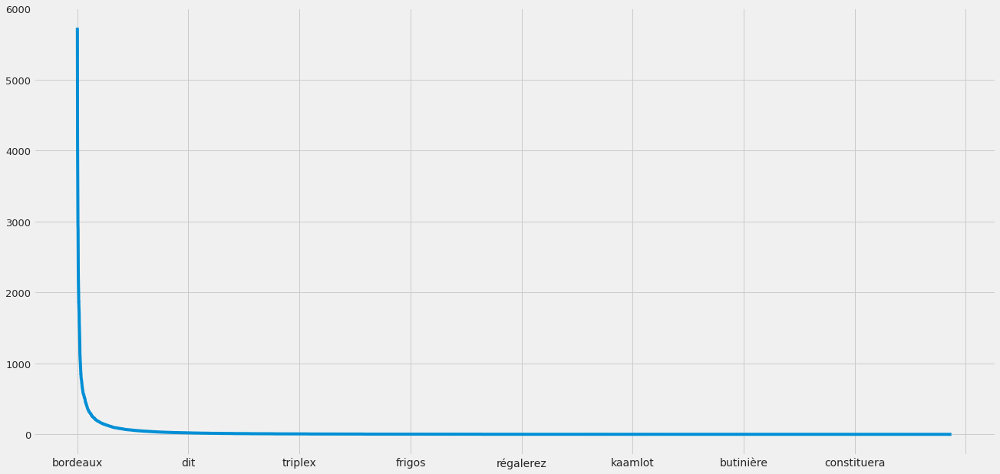

In [57]:
#Find words spreading (each word frequency)
freq_d = pd.Series(" ".join(df_T['Desc_pre']).split()).value_counts()
#Plot the words distribution
freq_d.plot(kind='line', ax=None, figsize=(20,10), use_index=True,
            title=None, grid=None, legend=False, style=None,
            logx=False, logy=False, loglog=False, xticks=None,
            yticks=None, xlim=None, ylim=None, rot=None,
            fontsize=None, colormap=None, table=False, yerr=None,
            xerr=None, label=None, secondary_y=False)

In [58]:
wordCount = pd.DataFrame(data = {
    'word':freq_d.index,
    'occurence':freq_d.values
})

freq_d[0]

5733

In [59]:
fig = px.line(freq_d, x=freq_d.index, y=freq_d.values, title='Words Count')
fig.show()

In [ ]:
#freq_d
#rare_d

In [61]:
#15 -> 3000
#Remove the least frequent words
rare_d = list(wordCount['word'].where(wordCount['occurence']<15).dropna().values)
df_T['Desc_pre'] = df_T['Desc_pre'].apply(lambda x: " ".join(x for x in x.split() if x not in rare_d))
#Remove the most frequent words
freq_w = list(wordCount['word'].where(wordCount['occurence']>3000).dropna().values)
df_T['Desc_pre'] = df_T['Desc_pre'].apply(lambda x: " ".join(x for x in x.split() if x not in freq_w))

<ipython-input-61-e798355976c0>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-61-e798355976c0>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [62]:
df_T['Desc_pre'] = [text.split() for text in df_T['Desc_pre']]


dict_d = corpora.Dictionary(df_T['Desc_pre'])
corpus_d = [dict_d.doc2bow(line) for line in df_T['Desc_pre']]
#Transform vectors of texts to scalar values (calculating norms of vectors)
corpus_d_vec_norm = [LA.norm(vec) for vec in corpus_d]
#Replace text descriptions in the database with norms of vectors
df_T['Desc_pre'] = corpus_d_vec_norm

<ipython-input-62-ac8089d28e9b>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-62-ac8089d28e9b>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [63]:
#len(set(df_T['Desc_pre'].iloc[0]))
#df_T.to_csv('df_T2.csv')
#df_T = pd.read_csv('df_T2.csv')
df_T['Desc_pre']
#df_T['Desc_pre'].values[0]

1         900.720822
2         854.767805
3        2823.611163
4        2359.585769
5        3013.361412
6        3951.741009
7        3610.694532
8        3648.065515
9        5121.062097
10       5055.213546
11       5348.889044
12       3895.755382
17       4878.271620
18       4384.148036
19       4399.151054
20       7398.615343
21       9148.561362
22       7187.255944
23      11424.845951
25      10148.700262
26       7248.865635
27       6094.107728
28       7804.617672
29       8752.299127
30       8968.158395
31       8743.129474
32       5816.217327
34       9853.623496
35      11875.134231
36       6391.375126
37       6075.544914
39       7713.671305
40       9890.823120
42      13460.136552
43      10282.084759
44       8182.835755
46      10687.846369
48      11226.980182
49       6838.478559
50      10899.027113
51       9390.464632
52       6107.945809
53      12961.854921
54      11020.429937
55       4714.216584
56       8982.869753
58      10040.307167
59      10370

In [64]:
#df_T['Desc_pre']
#df_T =fill_Nan(df_T,'Reg_pre','void')
df_T

,Titre,Description,reglement_interieur,PrixNuitee,Desc_pre,Reg_pre,Titre_pre
1,Sunny flat aux Chartrons,Le logement\n\nSitué dans le quartier des Char...,L'appartement est non fumeur.\n\nVous pouvez n...,71,900.720822,appartement non fumeur pouvez néanmoins fumer ...,sunny flat chartrons
2,L'Echoppe des Bouilles,Le logement\n\nL’Échoppe des Bouilles est une ...,L'entrée dans les lieux se fait après 16:00\n\n,75,854.767805,entrée lieux fait après,echoppe bouilles
3,Terrace with spectacular view,Bordeaux Terrace is a two bedroom apartment in...,L'entrée dans les lieux se fait après 15:00\n\...,155,2823.611163,entrée lieux fait après please smoke apartment...,terrace spectacular view
4,Appartement charme bordeaux centre,Le logement\n\nAppartement avec beaucoup de ca...,Ne convient pas aux animaux\n\nPas de fête ni ...,80,2359.585769,convient animaux fête soirée entrée lieux fait...,appartement charme bordeaux centre
5,Elegant 1 bd with amazing views,Spacious one bedroom apartment in the historic...,L'entrée dans les lieux se fait après 15:00\n\...,120,3013.361412,entrée lieux fait après please treat beautiful...,elegant amazing view
6,Large,"This spacious one bedroom apartment (1,002 sq ...",L'entrée dans les lieux se fait après 14:00\n\...,140,3951.741009,entrée lieux fait après please respect neighbo...,large
7,Fairytale view in historic heart - 2 bd + elev...,"Situated in the heart of the historic city, wi...",Non fumeur\n\nNe convient pas aux animaux\n\nP...,159,3610.694532,non fumeur convient animaux fête soirée entrée...,fairytale view historic heart elevator
8,STUDIO BORDEAUX TRIANGLE D OR *****,Le logement\n\nVous trouverez vite vos repères...,Non fumeur\n\nPas de fête ni de soirée\n\nNe c...,55,3648.065515,non fumeur fête soirée convient bébés an heure...,studio bordeaux triangle
9,Suite New-York,Le logement\n\nBordelais et professionnels de ...,L'entrée dans les lieux se fait après 17:00\n\...,155,5121.062097,entrée lieux fait après non smoking room,suite new york
10,Suite-Bois Flotté,Le logement\n\nSuite Bois FlottéBordelais et p...,L'entrée dans les lieux se fait après 16:00\n\...,145,5055.213546,entrée lieux fait après non smoking room,suite bois flotté


In [65]:
df_T['Reg_pre'] = df_T['Reg_pre'].fillna('laA7ad')
df_T['Reg_pre'].values[1971]

<ipython-input-65-0e8a73b87f95>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



''

### Reglement interieur

<AxesSubplot:>

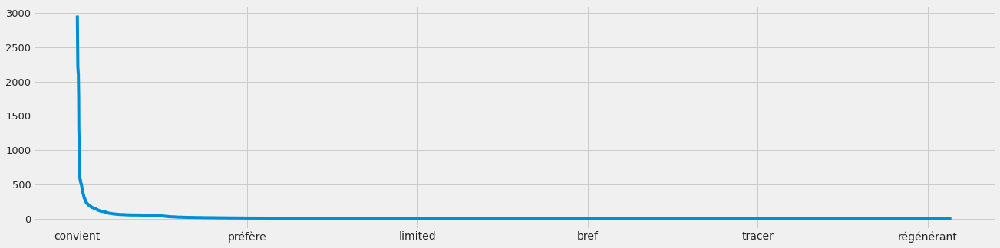

In [66]:
#df_T['Reg_pre']
#Find words spreading (each word frequency)
freq_d = pd.Series(" ".join(df_T['Reg_pre']).split()).value_counts()
#Plot the words distribution
freq_d.plot(kind='line', ax=None, figsize=(20,5), use_index=True,
            title=None, grid=None, legend=False, style=None,
            logx=False, logy=False, loglog=False, xticks=None,
            yticks=None, xlim=None, ylim=None, rot=None,
            fontsize=None, colormap=None, table=False, yerr=None,
            xerr=None, label=None, secondary_y=False)

In [67]:
wordCount = pd.DataFrame(data = {
    'word':freq_d.index,
    'occurence':freq_d.values
})


In [68]:
fig = px.line(freq_d, x=freq_d.index, y=freq_d.values, title='Words Count')
fig.show()

In [69]:
#15 -> 2000
#Remove the least frequent words
rare_d = list(wordCount['word'].where(wordCount['occurence']<15).dropna().values)
df_T['Reg_pre'] = df_T['Reg_pre'].apply(lambda x: " ".join(x for x in x.split() if x not in rare_d))
#Remove the most frequent words
freq_w = list(wordCount['word'].where(wordCount['occurence']>2500).dropna().values)
df_T['Reg_pre'] = df_T['Reg_pre'].apply(lambda x: " ".join(x for x in x.split() if x not in freq_w))

<ipython-input-69-436df296d0b9>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-69-436df296d0b9>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [70]:
df_T['Reg_pre'] = [text.split() for text in df_T['Reg_pre']]


dict_d = corpora.Dictionary(df_T['Reg_pre'])
corpus_d = [dict_d.doc2bow(line) for line in df_T['Reg_pre']]
#Transform vectors of texts to scalar values (calculating norms of vectors)
corpus_d_vec_norm = [LA.norm(vec) for vec in corpus_d]
#Replace text descriptions in the database with norms of vectors
df_T['Reg_pre'] = corpus_d_vec_norm

<ipython-input-70-d141502c0d17>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-70-d141502c0d17>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [71]:
#df_T

### Titre

In [72]:
df_T['Titre_pre'] = df_T['Titre_pre'].fillna('laA7ad')

<ipython-input-72-85da24a57e45>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [73]:
df_T.isnull().sum()

Titre                  0
Description            0
reglement_interieur    0
PrixNuitee             0
Desc_pre               0
Reg_pre                0
Titre_pre              0
dtype: int64

<AxesSubplot:>

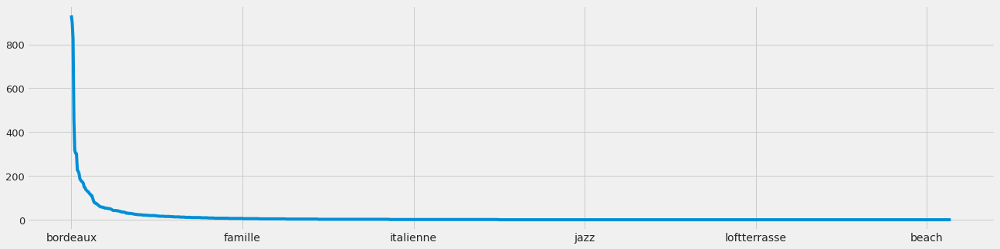

In [74]:
#Find words spreading (each word frequency)
freq_d = pd.Series(" ".join(df_T['Titre_pre']).split()).value_counts()
#Plot the words distribution
freq_d.plot(kind='line', ax=None, figsize=(20,5), use_index=True,
            title=None, grid=None, legend=False, style=None,
            logx=False, logy=False, loglog=False, xticks=None,
            yticks=None, xlim=None, ylim=None, rot=None,
            fontsize=None, colormap=None, table=False, yerr=None,
            xerr=None, label=None, secondary_y=False)

In [75]:
fig = px.line(freq_d, x=freq_d.index, y=freq_d.values, title='Words Count')
fig.show()

In [76]:
wordCount = pd.DataFrame(data = {
    'word':freq_d.index,
    'occurence':freq_d.values
})


In [77]:
#15 -> 2000
#Remove the least frequent words
rare_d = list(wordCount['word'].where(wordCount['occurence']<15).dropna().values)
df_T['Titre_pre'] = df_T['Titre_pre'].apply(lambda x: " ".join(x for x in x.split() if x not in rare_d))
#Remove the most frequent words
freq_w = list(wordCount['word'].where(wordCount['occurence']>800).dropna().values)
df_T['Titre_pre'] = df_T['Titre_pre'].apply(lambda x: " ".join(x for x in x.split() if x not in freq_w))

<ipython-input-77-9af4bee0cb42>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-77-9af4bee0cb42>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [78]:
df_T['Titre_pre'] = [text.split() for text in df_T['Titre_pre']]


dict_d = corpora.Dictionary(df_T['Titre_pre'])
corpus_d = [dict_d.doc2bow(line) for line in df_T['Titre_pre']]
#Transform vectors of texts to scalar values (calculating norms of vectors)
corpus_d_vec_norm = [LA.norm(vec) for vec in corpus_d]
#Replace text descriptions in the database with norms of vectors
df_T['Titre_pre'] = corpus_d_vec_norm

<ipython-input-78-f44c26cea328>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-78-f44c26cea328>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [79]:
df_T.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3534 entries, 1 to 4878
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Titre                3534 non-null   object 
 1   Description          3534 non-null   object 
 2   reglement_interieur  3534 non-null   object 
 3   PrixNuitee           3534 non-null   int64  
 4   Desc_pre             3534 non-null   float64
 5   Reg_pre              3534 non-null   float64
 6   Titre_pre            3534 non-null   float64
dtypes: float64(3), int64(1), object(3)
memory usage: 380.9+ KB


In [80]:
df_T

,Titre,Description,reglement_interieur,PrixNuitee,Desc_pre,Reg_pre,Titre_pre
1,Sunny flat aux Chartrons,Le logement\n\nSitué dans le quartier des Char...,L'appartement est non fumeur.\n\nVous pouvez n...,71,900.720822,9.899495,1.732051
2,L'Echoppe des Bouilles,Le logement\n\nL’Échoppe des Bouilles est une ...,L'entrée dans les lieux se fait après 16:00\n\n,75,854.767805,17.262677,2.236068
3,Terrace with spectacular view,Bordeaux Terrace is a two bedroom apartment in...,L'entrée dans les lieux se fait après 15:00\n\...,155,2823.611163,65.276336,0.000000
4,Appartement charme bordeaux centre,Le logement\n\nAppartement avec beaucoup de ca...,Ne convient pas aux animaux\n\nPas de fête ni ...,80,2359.585769,50.803543,3.162278
5,Elegant 1 bd with amazing views,Spacious one bedroom apartment in the historic...,L'entrée dans les lieux se fait après 15:00\n\...,120,3013.361412,66.068147,0.000000
6,Large,"This spacious one bedroom apartment (1,002 sq ...",L'entrée dans les lieux se fait après 14:00\n\...,140,3951.741009,69.036222,0.000000
7,Fairytale view in historic heart - 2 bd + elev...,"Situated in the heart of the historic city, wi...",Non fumeur\n\nNe convient pas aux animaux\n\nP...,159,3610.694532,73.559500,0.000000
8,STUDIO BORDEAUX TRIANGLE D OR *****,Le logement\n\nVous trouverez vite vos repères...,Non fumeur\n\nPas de fête ni de soirée\n\nNe c...,55,3648.065515,70.256672,6.557439
9,Suite New-York,Le logement\n\nBordelais et professionnels de ...,L'entrée dans les lieux se fait après 17:00\n\...,155,5121.062097,51.439285,6.082763
10,Suite-Bois Flotté,Le logement\n\nSuite Bois FlottéBordelais et p...,L'entrée dans les lieux se fait après 16:00\n\...,145,5055.213546,51.439285,6.082763


In [81]:
df_C['Desc_pre'] = df_T['Desc_pre'].values
df_C['Titre_pre'] = df_T['Titre_pre'].values
df_C['Reg_pre'] = df_T['Reg_pre'].values

In [82]:
df_F = df_C.drop(['Titre','reglement_interieur','Description'],axis=1)

In [83]:
df_C.info()#isnull().sum()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3534 entries, 1 to 4878
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Titre                  3534 non-null   object 
 1   Type_logement          3534 non-null   object 
 2   type_propriete         3534 non-null   object 
 3   type_lit               3534 non-null   object 
 4   Animal_sur_place       3534 non-null   object 
 5   conditions_annulation  3534 non-null   object 
 6   Description            3534 non-null   object 
 7   reglement_interieur    3534 non-null   object 
 8   PrixNuitee             3534 non-null   int64  
 9   NbChambres             3534 non-null   int64  
 10  Capacite_accueil       3534 non-null   int64  
 11  Desc_pre               3534 non-null   float64
 12  Titre_pre              3534 non-null   float64
 13  Reg_pre                3534 non-null   float64
dtypes: float64(3), int64(3), object(8)
memory usage: 574.1+ 

In [84]:
#df_F = pd.read_csv('df_F.csv')
#df_F.to_csv('df_F.csv')

## Data Encoding

In [85]:
df_F = df_F.drop(['Animal_sur_place','conditions_annulation','type_lit'],axis = 1)

In [86]:
df_F = df_F[['Type_logement','type_propriete','PrixNuitee','NbChambres','Capacite_accueil','Desc_pre','Titre_pre','Reg_pre']]

In [87]:
# creating instance of labelencoder
labelencoder = LabelEncoder()
# Assigning numerical values and storing in another column
df_F['Type_logement_labels'] = labelencoder.fit_transform(df_F['Type_logement'])
df_F['type_propriete_labels'] = labelencoder.fit_transform(df_F['type_propriete'])
df_F

,Type_logement,type_propriete,PrixNuitee,NbChambres,Capacite_accueil,Desc_pre,Titre_pre,Reg_pre,Type_logement_labels,type_propriete_labels
1,Logement entier,Appartement,71,1,2,900.720822,1.732051,9.899495,2,0
2,Chambre privée,Maison,75,1,2,854.767805,2.236068,17.262677,1,9
3,Logement entier,Appartement,155,2,4,2823.611163,0.000000,65.276336,2,0
4,Logement entier,Appartement,80,1,4,2359.585769,3.162278,50.803543,2,0
5,Logement entier,Appartement,120,1,2,3013.361412,0.000000,66.068147,2,0
6,Logement entier,Appartement,140,1,3,3951.741009,0.000000,69.036222,2,0
7,Logement entier,Appartement,159,2,6,3610.694532,0.000000,73.559500,2,0
8,Logement entier,Appartement,55,0,3,3648.065515,6.557439,70.256672,2,0
9,Chambre privée,Bed & Breakfast,155,1,2,5121.062097,6.082763,51.439285,1,3
10,Chambre privée,Bed & Breakfast,145,1,2,5055.213546,6.082763,51.439285,1,3


In [88]:
df_train = df_F[['NbChambres','Capacite_accueil','Type_logement_labels','type_propriete_labels','Desc_pre','Reg_pre','Titre_pre','PrixNuitee']]

In [89]:
#df_train['Desc_pre'] = df_train['Desc_pre'].fillna('')
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3534 entries, 1 to 4878
Data columns (total 8 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   NbChambres             3534 non-null   int64  
 1   Capacite_accueil       3534 non-null   int64  
 2   Type_logement_labels   3534 non-null   int64  
 3   type_propriete_labels  3534 non-null   int64  
 4   Desc_pre               3534 non-null   float64
 5   Reg_pre                3534 non-null   float64
 6   Titre_pre              3534 non-null   float64
 7   PrixNuitee             3534 non-null   int64  
dtypes: float64(3), int64(5)
memory usage: 408.5 KB


In [90]:
mlpreg = MLPRegressor(hidden_layer_sizes=(20,), activation='relu',
         solver='adam', alpha=0.1, batch_size='auto',
         learning_rate='adaptive', learning_rate_init=0.00001,
         power_t=0.5, max_iter=100000, shuffle=True, random_state=1,
         tol=0.0001, verbose=False, warm_start=False, momentum=0.9,
         nesterovs_momentum=True, early_stopping=False,
         validation_fraction=0.1, beta_1=0.9, beta_2=0.999,
         epsilon=1e-08)

In [91]:
X = df_train.drop(['PrixNuitee'],axis=1)
y = df_train['PrixNuitee']
X_train, X_test, y_train, y_test = train_test_split(X, y,random_state=1, test_size=0.05)

In [ ]:
mlpreg.fit(X_train, y_train)

In [ ]:
y_pred = mlpreg.predict(X_test)

In [ ]:
fig = px.scatter(x=y_test, y=y_pred, labels={'x': 'ground truth', 'y': 'prediction'})
fig.add_shape(
    type="line", line=dict(dash='dash'),
    x0=y_test.min(), y0=y_test.min(),
    x1=y_test.max(), y1=y_test.max()
)
fig.show()

In [ ]:
mlpreg.score(X_train,y_train)

In [ ]:
mlpreg.score(X_test,y_test)

In [ ]:
y_pred = list(y_pred)
y_test = list(y_test.values)

In [ ]:
import sklearn.metrics as sm
print("Mean absolute error =", round(sm.mean_absolute_error(y_test, y_pred), 2)) 
print("Mean squared error =", round(sm.mean_squared_error(y_test, y_pred), 2)) 
print("Median absolute error =", round(sm.median_absolute_error(y_test, y_pred), 2)) 
print("Explain variance score =", round(sm.explained_variance_score(y_test, y_pred), 2)) 
print("R2 score =", round(sm.r2_score(y_test, y_pred), 2))

> Falk and Miller (1992) recommended that R2 values should be equal to or greater than 0.10 in order for the variance explained of a particular endogenous construct to be deemed adequate.


In [283]:
import joblib
# save the model to disk
filename = 'finalized_model_1.sav'
joblib.dump(mlpreg, filename)

# some time later...

# load the model from disk
loaded_model = joblib.load(filename)

In [17]:
from sklearn import svm


In [18]:
regr = svm.SVR()
regr.fit(X_train, y_train)


SVR()

In [19]:
y_pred = regr.predict(X_test)
y_test = np.array(y_test)

In [20]:
fig = px.scatter(x=y_test, y=y_pred, labels={'x': 'ground truth', 'y': 'prediction'})
fig.add_shape(
    type="line", line=dict(dash='dash'),
    x0=y_test.min(), y0=y_test.min(),
    x1=y_test.max(), y1=y_test.max()
)
fig.show()

In [21]:
from sklearn.preprocessing import OneHotEncoder


# creating instance of labelencoder
onhotEncoder = OneHotEncoder()
# Assigning numerical values and storing in another column
onhotEncoder.fit_transform(df_F[['Type_logement','type_propriete']]).toarray()
#df_F1['type_propriete_labels'] = onhotEncoder.fit_transform(df_F['type_propriete'])
#df_F1
onhotEncoder.categories_

[array(['Chambre partagée', 'Chambre privée', 'Logement entier'],
       dtype=object),
 array(['Appartement', 'Appartement en résidence', 'Autre',
        'Bed & Breakfast', 'Bungalow', 'Cabane', 'Dortoir', 'Inconnue',
        'Loft', 'Maison', 'Maison de ville', 'Villa'], dtype=object)]

In [22]:
onhotEncoder

OneHotEncoder()

In [23]:
df_F

,Type_logement,type_propriete,PrixNuitee,NbChambres,Capacite_accueil,Desc_pre,Titre_pre,Reg_pre,Type_logement_labels,type_propriete_labels
0,Logement entier,Appartement,71.0,1.0,2.0,910.782082,1.732051,9.899495,2,0
1,Chambre privée,Maison,75.0,1.0,2.0,860.016279,2.236068,17.262677,1,9
2,Logement entier,Appartement,155.0,2.0,4.0,2818.935792,0.000000,65.276336,2,0
3,Logement entier,Appartement,80.0,1.0,4.0,2359.983686,3.162278,50.803543,2,0
4,Logement entier,Appartement,120.0,1.0,2.0,2994.063961,0.000000,66.068147,2,0
5,Logement entier,Appartement,140.0,1.0,3.0,3950.575907,0.000000,69.036222,2,0
6,Logement entier,Appartement,159.0,2.0,6.0,3582.616362,0.000000,73.559500,2,0
7,Logement entier,Appartement,55.0,0.0,3.0,3634.640835,6.557439,70.256672,2,0
8,Chambre privée,Bed & Breakfast,155.0,1.0,2.0,5104.817137,6.082763,51.439285,1,3
9,Chambre privée,Bed & Breakfast,145.0,1.0,2.0,5039.130977,6.082763,51.439285,1,3


In [24]:
#df_F = df_F.drop(['Desc_pre'],axis = 1)

In [25]:
df_F

,Type_logement,type_propriete,PrixNuitee,NbChambres,Capacite_accueil,Desc_pre,Titre_pre,Reg_pre,Type_logement_labels,type_propriete_labels
0,Logement entier,Appartement,71.0,1.0,2.0,910.782082,1.732051,9.899495,2,0
1,Chambre privée,Maison,75.0,1.0,2.0,860.016279,2.236068,17.262677,1,9
2,Logement entier,Appartement,155.0,2.0,4.0,2818.935792,0.000000,65.276336,2,0
3,Logement entier,Appartement,80.0,1.0,4.0,2359.983686,3.162278,50.803543,2,0
4,Logement entier,Appartement,120.0,1.0,2.0,2994.063961,0.000000,66.068147,2,0
5,Logement entier,Appartement,140.0,1.0,3.0,3950.575907,0.000000,69.036222,2,0
6,Logement entier,Appartement,159.0,2.0,6.0,3582.616362,0.000000,73.559500,2,0
7,Logement entier,Appartement,55.0,0.0,3.0,3634.640835,6.557439,70.256672,2,0
8,Chambre privée,Bed & Breakfast,155.0,1.0,2.0,5104.817137,6.082763,51.439285,1,3
9,Chambre privée,Bed & Breakfast,145.0,1.0,2.0,5039.130977,6.082763,51.439285,1,3


In [26]:
#df_F = df_F.drop(['Animal_sur_place','conditions_annulation','type_lit'],axis =1)

In [27]:
df_F

,Type_logement,type_propriete,PrixNuitee,NbChambres,Capacite_accueil,Desc_pre,Titre_pre,Reg_pre,Type_logement_labels,type_propriete_labels
0,Logement entier,Appartement,71.0,1.0,2.0,910.782082,1.732051,9.899495,2,0
1,Chambre privée,Maison,75.0,1.0,2.0,860.016279,2.236068,17.262677,1,9
2,Logement entier,Appartement,155.0,2.0,4.0,2818.935792,0.000000,65.276336,2,0
3,Logement entier,Appartement,80.0,1.0,4.0,2359.983686,3.162278,50.803543,2,0
4,Logement entier,Appartement,120.0,1.0,2.0,2994.063961,0.000000,66.068147,2,0
5,Logement entier,Appartement,140.0,1.0,3.0,3950.575907,0.000000,69.036222,2,0
6,Logement entier,Appartement,159.0,2.0,6.0,3582.616362,0.000000,73.559500,2,0
7,Logement entier,Appartement,55.0,0.0,3.0,3634.640835,6.557439,70.256672,2,0
8,Chambre privée,Bed & Breakfast,155.0,1.0,2.0,5104.817137,6.082763,51.439285,1,3
9,Chambre privée,Bed & Breakfast,145.0,1.0,2.0,5039.130977,6.082763,51.439285,1,3


In [28]:
df_F12 = df_F[['NbChambres','Capacite_accueil','PrixNuitee']]

In [29]:
df_F12

,NbChambres,Capacite_accueil,PrixNuitee
0,1.0,2.0,71.0
1,1.0,2.0,75.0
2,2.0,4.0,155.0
3,1.0,4.0,80.0
4,1.0,2.0,120.0
5,1.0,3.0,140.0
6,2.0,6.0,159.0
7,0.0,3.0,55.0
8,1.0,2.0,155.0
9,1.0,2.0,145.0


In [30]:
import statsmodels.api as sm

In [31]:
y = df_F12['PrixNuitee']
X1 = df_F12['NbChambres'].values
X2 = df_F12['Capacite_accueil'].values
X = [X1,X2]

In [32]:
X

[array([1., 1., 2., ..., 1., 1., 1.]), array([2., 2., 4., ..., 2., 4., 4.])]

In [33]:
def reg_m(y, x):
    ones = np.ones(len(x[0]))
    X = sm.add_constant(np.column_stack((x[0], ones)))
    for ele in x[1:]:
        X = sm.add_constant(np.column_stack((ele, X)))
    results = sm.OLS(y, X).fit()
    return results

print(reg_m(y, X).summary())

                            OLS Regression Results                            
Dep. Variable:             PrixNuitee   R-squared:                       0.442
Model:                            OLS   Adj. R-squared:                  0.442
Method:                 Least Squares   F-statistic:                     1367.
Date:                Wed, 09 Feb 2022   Prob (F-statistic):               0.00
Time:                        14:50:10   Log-Likelihood:                -17215.
No. Observations:                3450   AIC:                         3.444e+04
Df Residuals:                    3447   BIC:                         3.445e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1             9.9071      0.576     17.212      0.0

In [34]:
from sklearn.preprocessing import StandardScaler,LabelEncoder
from sklearn.model_selection import GridSearchCV,train_test_split,cross_val_score
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression,Lasso,Ridge,ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error,mean_absolute_error

In [35]:
df_F

,Type_logement,type_propriete,PrixNuitee,NbChambres,Capacite_accueil,Desc_pre,Titre_pre,Reg_pre,Type_logement_labels,type_propriete_labels
0,Logement entier,Appartement,71.0,1.0,2.0,910.782082,1.732051,9.899495,2,0
1,Chambre privée,Maison,75.0,1.0,2.0,860.016279,2.236068,17.262677,1,9
2,Logement entier,Appartement,155.0,2.0,4.0,2818.935792,0.000000,65.276336,2,0
3,Logement entier,Appartement,80.0,1.0,4.0,2359.983686,3.162278,50.803543,2,0
4,Logement entier,Appartement,120.0,1.0,2.0,2994.063961,0.000000,66.068147,2,0
5,Logement entier,Appartement,140.0,1.0,3.0,3950.575907,0.000000,69.036222,2,0
6,Logement entier,Appartement,159.0,2.0,6.0,3582.616362,0.000000,73.559500,2,0
7,Logement entier,Appartement,55.0,0.0,3.0,3634.640835,6.557439,70.256672,2,0
8,Chambre privée,Bed & Breakfast,155.0,1.0,2.0,5104.817137,6.082763,51.439285,1,3
9,Chambre privée,Bed & Breakfast,145.0,1.0,2.0,5039.130977,6.082763,51.439285,1,3


## Decission Tree Regressor:

In [36]:
from sklearn.tree import DecisionTreeRegressor
from sklearn import tree


In [37]:
tree_set = df_train.copy()
tree_set = tree_set.fillna(0)
target = tree_set["PrixNuitee"]
tree_set.drop(["PrixNuitee"], axis=1, inplace=True)

tree_clf = DecisionTreeRegressor(max_depth=5, random_state=1)
tree_clf.fit(tree_set, target)
text_representation = tree.export_text(tree_clf, feature_names=tree_set.columns.tolist())
print(text_representation)
print("accuracy: " + str(tree_clf.score(tree_set, target)))

|--- NbChambres <= 1.50
|   |--- Capacite_accueil <= 2.50
|   |   |--- Type_logement_labels <= 1.50
|   |   |   |--- type_propriete_labels <= 1.50
|   |   |   |   |--- Desc_pre <= 7935.25
|   |   |   |   |   |--- value: [42.55]
|   |   |   |   |--- Desc_pre >  7935.25
|   |   |   |   |   |--- value: [35.64]
|   |   |   |--- type_propriete_labels >  1.50
|   |   |   |   |--- type_propriete_labels <= 5.00
|   |   |   |   |   |--- value: [68.04]
|   |   |   |   |--- type_propriete_labels >  5.00
|   |   |   |   |   |--- value: [45.34]
|   |   |--- Type_logement_labels >  1.50
|   |   |   |--- NbChambres <= 0.50
|   |   |   |   |--- Reg_pre <= 2714.59
|   |   |   |   |   |--- value: [50.38]
|   |   |   |   |--- Reg_pre >  2714.59
|   |   |   |   |   |--- value: [77.50]
|   |   |   |--- NbChambres >  0.50
|   |   |   |   |--- Reg_pre <= 1947.61
|   |   |   |   |   |--- value: [61.09]
|   |   |   |   |--- Reg_pre >  1947.61
|   |   |   |   |   |--- value: [92.43]
|   |--- Capacite_accueil > 

In [38]:
y_predict = tree_clf.predict(X_test)


In [42]:
print(rmsle(y_test, y_predict))

23.27822428661784


In [43]:
fig = px.scatter(x=y_test, y=y_predict, labels={'x': 'ground truth', 'y': 'prediction'})
fig.add_shape(
    type="line", line=dict(dash='dash'),
    x0=y_test.min(), y0=y_test.min(),
    x1=y_test.max(), y1=y_test.max()
)
fig.show()

## Xgboost Regressor

In [44]:
import xgboost as xgb


In [45]:
xgb_param = {'num_leaves': 100,
                'learning_rate': 0.03,
                'min_data_in_leaf': 80,
                'objective': 'reg:linear',      # huber, gamma, reg:linear
                'max_depth': 40,
                'min_child_samples': 100,
                'boosting': 'gbdt',
                'feature_fraction': 0.8,
                'bagging_freq': 20,
                'bagging_fraction': 0.5,
                'bagging_seed': 500,
                'metric': 'rmse',
                'lambda_l1': 0.5,
                'verbosity': 3,
                'nthread': 5,
                'random_state': 0,
                'subsample': 0.7,
                'n_estimators': 5000,
                'colsample_bytree': 0.8
                }

In [46]:
model_xgb = xgb.XGBRegressor(num_leaves=xgb_param['num_leaves'],
                            learning_rate=xgb_param['learning_rate'],
                            min_data_in_leaf=xgb_param['min_data_in_leaf'],
                            objectivce=xgb_param['objective'],
                            max_depth=xgb_param['max_depth'],
                            min_child_samples=xgb_param['min_child_samples'],
                            boosting=xgb_param['boosting'],
                            feature_fraction=xgb_param['feature_fraction'],
                            bagging_freq=xgb_param['bagging_freq'],
                            bagging_fraction=xgb_param['bagging_fraction'],
                            bagging_seed=xgb_param['bagging_seed'],
                            metric=xgb_param['metric'],
                            lambda_l1=xgb_param['lambda_l1'],
                            verbosity=xgb_param['verbosity'],
                            nthread=xgb_param['nthread'],
                            random_state=xgb_param['random_state'],
                            subsample=xgb_param['subsample'],
                            n_estimators=xgb_param['n_estimators'],
                            colsample_bytree=xgb_param['colsample_bytree'])

In [47]:
model_xgb.fit(X_train, y_train)
xgb_train_pred = model_xgb.predict(X_train)
xgb_test_pred = model_xgb.predict(X_test)

[14:52:14] WARNING: ../src/learner.cc:541: 
Parameters: { bagging_fraction, bagging_freq, bagging_seed, boosting, feature_fraction, lambda_l1, metric, min_child_samples, min_data_in_leaf, num_leaves, objectivce } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:52:14] DEBUG: ../src/gbm/gbtree.cc:154: Using tree method: 2
[14:52:14] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 140 extra nodes, 0 pruned nodes, max_depth=18
[14:52:14] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 88 extra nodes, 0 pruned nodes, max_depth=10
[14:52:14] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 170 extra nodes, 0 pruned nodes, max_depth=17
[14:52:14] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 288 extra nodes, 0 pruned nodes, max_depth=17
[14:

[14:52:15] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2336 extra nodes, 0 pruned nodes, max_depth=33
[14:52:15] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2396 extra nodes, 0 pruned nodes, max_depth=30
[14:52:15] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1770 extra nodes, 0 pruned nodes, max_depth=26
[14:52:15] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2256 extra nodes, 0 pruned nodes, max_depth=29
[14:52:15] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2370 extra nodes, 0 pruned nodes, max_depth=29
[14:52:15] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2396 extra nodes, 0 pruned nodes, max_depth=35
[14:52:15] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2580 extra nodes, 0 pruned nodes, max_depth=28
[14:52:15] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2410 extra nodes, 0 pruned nodes, max_depth=32
[14:52:15] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 254

[14:52:16] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2716 extra nodes, 0 pruned nodes, max_depth=39
[14:52:16] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2790 extra nodes, 0 pruned nodes, max_depth=36
[14:52:16] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2822 extra nodes, 0 pruned nodes, max_depth=32
[14:52:16] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2886 extra nodes, 0 pruned nodes, max_depth=34
[14:52:16] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2842 extra nodes, 0 pruned nodes, max_depth=35
[14:52:16] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2758 extra nodes, 0 pruned nodes, max_depth=29
[14:52:16] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2808 extra nodes, 0 pruned nodes, max_depth=29
[14:52:16] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2694 extra nodes, 0 pruned nodes, max_depth=36
[14:52:16] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 265

[14:52:17] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2840 extra nodes, 0 pruned nodes, max_depth=36
[14:52:17] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2534 extra nodes, 0 pruned nodes, max_depth=33
[14:52:17] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2824 extra nodes, 0 pruned nodes, max_depth=33
[14:52:17] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2856 extra nodes, 0 pruned nodes, max_depth=37
[14:52:17] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2686 extra nodes, 0 pruned nodes, max_depth=40
[14:52:17] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2854 extra nodes, 0 pruned nodes, max_depth=29
[14:52:17] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2778 extra nodes, 0 pruned nodes, max_depth=32
[14:52:17] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2684 extra nodes, 0 pruned nodes, max_depth=40
[14:52:17] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 289

[14:52:18] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2916 extra nodes, 0 pruned nodes, max_depth=35
[14:52:18] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2498 extra nodes, 0 pruned nodes, max_depth=40
[14:52:18] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2952 extra nodes, 0 pruned nodes, max_depth=31
[14:52:18] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2986 extra nodes, 0 pruned nodes, max_depth=40
[14:52:18] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2776 extra nodes, 0 pruned nodes, max_depth=40
[14:52:18] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2914 extra nodes, 0 pruned nodes, max_depth=33
[14:52:18] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2808 extra nodes, 0 pruned nodes, max_depth=34
[14:52:18] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2938 extra nodes, 0 pruned nodes, max_depth=40
[14:52:18] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 297

[14:52:19] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3032 extra nodes, 0 pruned nodes, max_depth=33
[14:52:19] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2796 extra nodes, 0 pruned nodes, max_depth=40
[14:52:19] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2948 extra nodes, 0 pruned nodes, max_depth=30
[14:52:19] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2894 extra nodes, 0 pruned nodes, max_depth=36
[14:52:19] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3098 extra nodes, 0 pruned nodes, max_depth=40
[14:52:19] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2934 extra nodes, 0 pruned nodes, max_depth=31
[14:52:19] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2872 extra nodes, 0 pruned nodes, max_depth=38
[14:52:19] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2994 extra nodes, 0 pruned nodes, max_depth=31
[14:52:19] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 305

[14:52:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2974 extra nodes, 0 pruned nodes, max_depth=33
[14:52:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3228 extra nodes, 0 pruned nodes, max_depth=40
[14:52:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2506 extra nodes, 0 pruned nodes, max_depth=33
[14:52:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3054 extra nodes, 0 pruned nodes, max_depth=39
[14:52:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2628 extra nodes, 0 pruned nodes, max_depth=40
[14:52:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2938 extra nodes, 0 pruned nodes, max_depth=34
[14:52:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3016 extra nodes, 0 pruned nodes, max_depth=39
[14:52:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2996 extra nodes, 0 pruned nodes, max_depth=37
[14:52:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 267

[14:52:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2830 extra nodes, 0 pruned nodes, max_depth=40
[14:52:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3016 extra nodes, 0 pruned nodes, max_depth=32
[14:52:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2992 extra nodes, 0 pruned nodes, max_depth=38
[14:52:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3222 extra nodes, 0 pruned nodes, max_depth=40
[14:52:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2928 extra nodes, 0 pruned nodes, max_depth=35
[14:52:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3160 extra nodes, 0 pruned nodes, max_depth=36
[14:52:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2908 extra nodes, 0 pruned nodes, max_depth=40
[14:52:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3004 extra nodes, 0 pruned nodes, max_depth=40
[14:52:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 303

[14:52:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3020 extra nodes, 0 pruned nodes, max_depth=36
[14:52:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2990 extra nodes, 0 pruned nodes, max_depth=34
[14:52:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2882 extra nodes, 0 pruned nodes, max_depth=40
[14:52:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2902 extra nodes, 0 pruned nodes, max_depth=39
[14:52:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3044 extra nodes, 0 pruned nodes, max_depth=40
[14:52:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2916 extra nodes, 0 pruned nodes, max_depth=34
[14:52:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3052 extra nodes, 0 pruned nodes, max_depth=30
[14:52:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3032 extra nodes, 0 pruned nodes, max_depth=32
[14:52:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 288

[14:52:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2764 extra nodes, 0 pruned nodes, max_depth=37
[14:52:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2910 extra nodes, 0 pruned nodes, max_depth=32
[14:52:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2842 extra nodes, 0 pruned nodes, max_depth=34
[14:52:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2712 extra nodes, 0 pruned nodes, max_depth=40
[14:52:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2776 extra nodes, 0 pruned nodes, max_depth=40
[14:52:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2924 extra nodes, 0 pruned nodes, max_depth=36
[14:52:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2830 extra nodes, 0 pruned nodes, max_depth=35
[14:52:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2870 extra nodes, 0 pruned nodes, max_depth=35
[14:52:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 290

[14:52:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2596 extra nodes, 0 pruned nodes, max_depth=38
[14:52:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2560 extra nodes, 0 pruned nodes, max_depth=31
[14:52:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2500 extra nodes, 0 pruned nodes, max_depth=32
[14:52:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2128 extra nodes, 0 pruned nodes, max_depth=31
[14:52:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2662 extra nodes, 0 pruned nodes, max_depth=36
[14:52:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2756 extra nodes, 0 pruned nodes, max_depth=38
[14:52:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2500 extra nodes, 0 pruned nodes, max_depth=36
[14:52:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2670 extra nodes, 0 pruned nodes, max_depth=38
[14:52:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 249

[14:52:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2090 extra nodes, 0 pruned nodes, max_depth=40
[14:52:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2180 extra nodes, 0 pruned nodes, max_depth=32
[14:52:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2058 extra nodes, 0 pruned nodes, max_depth=36
[14:52:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2158 extra nodes, 0 pruned nodes, max_depth=40
[14:52:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2214 extra nodes, 0 pruned nodes, max_depth=33
[14:52:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2164 extra nodes, 0 pruned nodes, max_depth=31
[14:52:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2126 extra nodes, 0 pruned nodes, max_depth=33
[14:52:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2066 extra nodes, 0 pruned nodes, max_depth=40
[14:52:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 219

[14:52:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1654 extra nodes, 0 pruned nodes, max_depth=31
[14:52:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1590 extra nodes, 0 pruned nodes, max_depth=30
[14:52:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1594 extra nodes, 0 pruned nodes, max_depth=31
[14:52:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1570 extra nodes, 0 pruned nodes, max_depth=34
[14:52:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1524 extra nodes, 0 pruned nodes, max_depth=33
[14:52:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1464 extra nodes, 0 pruned nodes, max_depth=37
[14:52:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1486 extra nodes, 0 pruned nodes, max_depth=35
[14:52:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1578 extra nodes, 0 pruned nodes, max_depth=28
[14:52:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 155

[14:52:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1164 extra nodes, 0 pruned nodes, max_depth=30
[14:52:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1138 extra nodes, 0 pruned nodes, max_depth=27
[14:52:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1160 extra nodes, 0 pruned nodes, max_depth=25
[14:52:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 796 extra nodes, 0 pruned nodes, max_depth=19
[14:52:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 834 extra nodes, 0 pruned nodes, max_depth=24
[14:52:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 738 extra nodes, 0 pruned nodes, max_depth=26
[14:52:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1112 extra nodes, 0 pruned nodes, max_depth=35
[14:52:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1082 extra nodes, 0 pruned nodes, max_depth=23
[14:52:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1106 e

[14:52:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 796 extra nodes, 0 pruned nodes, max_depth=24
[14:52:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 434 extra nodes, 0 pruned nodes, max_depth=25
[14:52:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 758 extra nodes, 0 pruned nodes, max_depth=28
[14:52:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 796 extra nodes, 0 pruned nodes, max_depth=35
[14:52:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 802 extra nodes, 0 pruned nodes, max_depth=28
[14:52:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 806 extra nodes, 0 pruned nodes, max_depth=26
[14:52:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 596 extra nodes, 0 pruned nodes, max_depth=21
[14:52:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 778 extra nodes, 0 pruned nodes, max_depth=23
[14:52:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 722 extra n

[14:52:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 408 extra nodes, 0 pruned nodes, max_depth=23
[14:52:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 578 extra nodes, 0 pruned nodes, max_depth=23
[14:52:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 404 extra nodes, 0 pruned nodes, max_depth=19
[14:52:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 378 extra nodes, 0 pruned nodes, max_depth=18
[14:52:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 272 extra nodes, 0 pruned nodes, max_depth=16
[14:52:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 548 extra nodes, 0 pruned nodes, max_depth=25
[14:52:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 394 extra nodes, 0 pruned nodes, max_depth=23
[14:52:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 572 extra nodes, 0 pruned nodes, max_depth=32
[14:52:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 292 extra n

[14:52:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 454 extra nodes, 0 pruned nodes, max_depth=20
[14:52:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 356 extra nodes, 0 pruned nodes, max_depth=22
[14:52:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 254 extra nodes, 0 pruned nodes, max_depth=21
[14:52:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 342 extra nodes, 0 pruned nodes, max_depth=19
[14:52:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 486 extra nodes, 0 pruned nodes, max_depth=18
[14:52:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 444 extra nodes, 0 pruned nodes, max_depth=21
[14:52:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 404 extra nodes, 0 pruned nodes, max_depth=20
[14:52:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 288 extra nodes, 0 pruned nodes, max_depth=15
[14:52:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 270 extra n

[14:52:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 344 extra nodes, 0 pruned nodes, max_depth=20
[14:52:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 202 extra nodes, 0 pruned nodes, max_depth=15
[14:52:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 364 extra nodes, 0 pruned nodes, max_depth=19
[14:52:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 256 extra nodes, 0 pruned nodes, max_depth=18
[14:52:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 212 extra nodes, 0 pruned nodes, max_depth=15
[14:52:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 364 extra nodes, 0 pruned nodes, max_depth=26
[14:52:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 358 extra nodes, 0 pruned nodes, max_depth=19
[14:52:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 332 extra nodes, 0 pruned nodes, max_depth=23
[14:52:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 414 extra n

[14:52:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 242 extra nodes, 0 pruned nodes, max_depth=23
[14:52:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 302 extra nodes, 0 pruned nodes, max_depth=19
[14:52:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 158 extra nodes, 0 pruned nodes, max_depth=16
[14:52:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 358 extra nodes, 0 pruned nodes, max_depth=16
[14:52:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 260 extra nodes, 0 pruned nodes, max_depth=21
[14:52:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 334 extra nodes, 0 pruned nodes, max_depth=24
[14:52:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 178 extra nodes, 0 pruned nodes, max_depth=12
[14:52:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 340 extra nodes, 0 pruned nodes, max_depth=20
[14:52:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 266 extra n

[14:52:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 230 extra nodes, 0 pruned nodes, max_depth=14
[14:52:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 196 extra nodes, 0 pruned nodes, max_depth=12
[14:52:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 342 extra nodes, 0 pruned nodes, max_depth=17
[14:52:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 294 extra nodes, 0 pruned nodes, max_depth=18
[14:52:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 136 extra nodes, 0 pruned nodes, max_depth=12
[14:52:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 160 extra nodes, 0 pruned nodes, max_depth=11
[14:52:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 338 extra nodes, 0 pruned nodes, max_depth=21
[14:52:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 278 extra nodes, 0 pruned nodes, max_depth=20
[14:52:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 186 extra n

[14:52:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 188 extra nodes, 0 pruned nodes, max_depth=15
[14:52:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 208 extra nodes, 0 pruned nodes, max_depth=15
[14:52:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 266 extra nodes, 0 pruned nodes, max_depth=19
[14:52:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 164 extra nodes, 0 pruned nodes, max_depth=11
[14:52:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 234 extra nodes, 0 pruned nodes, max_depth=16
[14:52:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 256 extra nodes, 0 pruned nodes, max_depth=16
[14:52:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 340 extra nodes, 0 pruned nodes, max_depth=15
[14:52:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 242 extra nodes, 0 pruned nodes, max_depth=15
[14:52:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 176 extra n

[14:52:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 228 extra nodes, 0 pruned nodes, max_depth=13
[14:52:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 192 extra nodes, 0 pruned nodes, max_depth=17
[14:52:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 270 extra nodes, 0 pruned nodes, max_depth=17
[14:52:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 176 extra nodes, 0 pruned nodes, max_depth=15
[14:52:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 182 extra nodes, 0 pruned nodes, max_depth=14
[14:52:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 316 extra nodes, 0 pruned nodes, max_depth=23
[14:52:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 198 extra nodes, 0 pruned nodes, max_depth=13
[14:52:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 206 extra nodes, 0 pruned nodes, max_depth=16
[14:52:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 268 extra n

[14:52:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 352 extra nodes, 0 pruned nodes, max_depth=22
[14:52:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 328 extra nodes, 0 pruned nodes, max_depth=23
[14:52:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 144 extra nodes, 0 pruned nodes, max_depth=11
[14:52:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 164 extra nodes, 0 pruned nodes, max_depth=16
[14:52:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 362 extra nodes, 0 pruned nodes, max_depth=20
[14:52:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 228 extra nodes, 0 pruned nodes, max_depth=13
[14:52:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 204 extra nodes, 0 pruned nodes, max_depth=14
[14:52:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 372 extra nodes, 0 pruned nodes, max_depth=20
[14:52:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 206 extra n

[14:52:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 174 extra nodes, 0 pruned nodes, max_depth=11
[14:52:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 280 extra nodes, 0 pruned nodes, max_depth=22
[14:52:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 266 extra nodes, 0 pruned nodes, max_depth=14
[14:52:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 176 extra nodes, 0 pruned nodes, max_depth=12
[14:52:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 226 extra nodes, 0 pruned nodes, max_depth=17
[14:52:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 164 extra nodes, 0 pruned nodes, max_depth=13
[14:52:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 286 extra nodes, 0 pruned nodes, max_depth=14
[14:52:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 162 extra nodes, 0 pruned nodes, max_depth=11
[14:52:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 218 extra n

[14:52:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 174 extra nodes, 0 pruned nodes, max_depth=13
[14:52:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 152 extra nodes, 0 pruned nodes, max_depth=12
[14:52:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 224 extra nodes, 0 pruned nodes, max_depth=13
[14:52:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 142 extra nodes, 0 pruned nodes, max_depth=12
[14:52:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 186 extra nodes, 0 pruned nodes, max_depth=13
[14:52:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 102 extra nodes, 0 pruned nodes, max_depth=10
[14:52:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 206 extra nodes, 0 pruned nodes, max_depth=11
[14:52:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 170 extra nodes, 0 pruned nodes, max_depth=14
[14:52:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 240 extra n

[14:52:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 146 extra nodes, 0 pruned nodes, max_depth=10
[14:52:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 186 extra nodes, 0 pruned nodes, max_depth=13
[14:52:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 226 extra nodes, 0 pruned nodes, max_depth=13
[14:52:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 140 extra nodes, 0 pruned nodes, max_depth=11
[14:52:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 206 extra nodes, 0 pruned nodes, max_depth=13
[14:52:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 170 extra nodes, 0 pruned nodes, max_depth=13
[14:52:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 236 extra nodes, 0 pruned nodes, max_depth=17
[14:52:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 144 extra nodes, 0 pruned nodes, max_depth=12
[14:52:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 168 extra n

[14:52:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 158 extra nodes, 0 pruned nodes, max_depth=14
[14:52:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 140 extra nodes, 0 pruned nodes, max_depth=10
[14:52:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 298 extra nodes, 0 pruned nodes, max_depth=16
[14:52:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 208 extra nodes, 0 pruned nodes, max_depth=14
[14:52:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 312 extra nodes, 0 pruned nodes, max_depth=14
[14:52:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 130 extra nodes, 0 pruned nodes, max_depth=13
[14:52:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 202 extra nodes, 0 pruned nodes, max_depth=13
[14:52:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 264 extra nodes, 0 pruned nodes, max_depth=19
[14:52:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 224 extra n

[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 178 extra nodes, 0 pruned nodes, max_depth=15
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 164 extra nodes, 0 pruned nodes, max_depth=14
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 168 extra nodes, 0 pruned nodes, max_depth=17
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 200 extra nodes, 0 pruned nodes, max_depth=13
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 228 extra nodes, 0 pruned nodes, max_depth=14
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 198 extra nodes, 0 pruned nodes, max_depth=15
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 230 extra nodes, 0 pruned nodes, max_depth=18
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 256 extra nodes, 0 pruned nodes, max_depth=16
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 290 extra n

[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 154 extra nodes, 0 pruned nodes, max_depth=11
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 114 extra nodes, 0 pruned nodes, max_depth=10
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 150 extra nodes, 0 pruned nodes, max_depth=13
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 186 extra nodes, 0 pruned nodes, max_depth=12
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 324 extra nodes, 0 pruned nodes, max_depth=22
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 232 extra nodes, 0 pruned nodes, max_depth=21
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 212 extra nodes, 0 pruned nodes, max_depth=14
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 156 extra nodes, 0 pruned nodes, max_depth=13
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 232 extra n

[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 208 extra nodes, 0 pruned nodes, max_depth=14
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 146 extra nodes, 0 pruned nodes, max_depth=12
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 172 extra nodes, 0 pruned nodes, max_depth=15
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 140 extra nodes, 0 pruned nodes, max_depth=12
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 138 extra nodes, 0 pruned nodes, max_depth=13
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 208 extra nodes, 0 pruned nodes, max_depth=12
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 216 extra nodes, 0 pruned nodes, max_depth=15
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 220 extra nodes, 0 pruned nodes, max_depth=19
[14:52:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 182 extra n

[14:52:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 254 extra nodes, 0 pruned nodes, max_depth=19
[14:52:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 208 extra nodes, 0 pruned nodes, max_depth=14
[14:52:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 168 extra nodes, 0 pruned nodes, max_depth=15
[14:52:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 246 extra nodes, 0 pruned nodes, max_depth=19
[14:52:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 210 extra nodes, 0 pruned nodes, max_depth=15
[14:52:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 236 extra nodes, 0 pruned nodes, max_depth=20
[14:52:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 228 extra nodes, 0 pruned nodes, max_depth=21
[14:52:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 234 extra nodes, 0 pruned nodes, max_depth=14
[14:52:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 242 extra n

[14:52:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 130 extra nodes, 0 pruned nodes, max_depth=13
[14:52:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 178 extra nodes, 0 pruned nodes, max_depth=16
[14:52:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 206 extra nodes, 0 pruned nodes, max_depth=16
[14:52:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 168 extra nodes, 0 pruned nodes, max_depth=13
[14:52:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 132 extra nodes, 0 pruned nodes, max_depth=17
[14:52:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 234 extra nodes, 0 pruned nodes, max_depth=18
[14:52:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 162 extra nodes, 0 pruned nodes, max_depth=15
[14:52:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 144 extra nodes, 0 pruned nodes, max_depth=15
[14:52:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 148 extra n

[14:52:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 170 extra nodes, 0 pruned nodes, max_depth=13
[14:52:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 116 extra nodes, 0 pruned nodes, max_depth=12
[14:52:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 84 extra nodes, 0 pruned nodes, max_depth=10
[14:52:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 122 extra nodes, 0 pruned nodes, max_depth=14
[14:52:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 158 extra nodes, 0 pruned nodes, max_depth=16
[14:52:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 140 extra nodes, 0 pruned nodes, max_depth=17
[14:52:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 208 extra nodes, 0 pruned nodes, max_depth=15
[14:52:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 154 extra nodes, 0 pruned nodes, max_depth=17
[14:52:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 132 extra no

[14:52:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 236 extra nodes, 0 pruned nodes, max_depth=16
[14:52:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 216 extra nodes, 0 pruned nodes, max_depth=16
[14:52:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 226 extra nodes, 0 pruned nodes, max_depth=13
[14:52:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 196 extra nodes, 0 pruned nodes, max_depth=15
[14:52:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 144 extra nodes, 0 pruned nodes, max_depth=11
[14:52:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 240 extra nodes, 0 pruned nodes, max_depth=16
[14:52:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 168 extra nodes, 0 pruned nodes, max_depth=12
[14:52:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 166 extra nodes, 0 pruned nodes, max_depth=21
[14:52:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 284 extra n

[14:52:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 144 extra nodes, 0 pruned nodes, max_depth=10
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 150 extra nodes, 0 pruned nodes, max_depth=14
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 192 extra nodes, 0 pruned nodes, max_depth=13
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 114 extra nodes, 0 pruned nodes, max_depth=13
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 148 extra nodes, 0 pruned nodes, max_depth=13
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 142 extra nodes, 0 pruned nodes, max_depth=11
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 220 extra nodes, 0 pruned nodes, max_depth=18
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 160 extra nodes, 0 pruned nodes, max_depth=11
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 214 extra n

[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 150 extra nodes, 0 pruned nodes, max_depth=12
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 258 extra nodes, 0 pruned nodes, max_depth=16
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 186 extra nodes, 0 pruned nodes, max_depth=11
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 268 extra nodes, 0 pruned nodes, max_depth=14
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 196 extra nodes, 0 pruned nodes, max_depth=20
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 300 extra nodes, 0 pruned nodes, max_depth=16
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 270 extra nodes, 0 pruned nodes, max_depth=15
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 214 extra nodes, 0 pruned nodes, max_depth=12
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 178 extra n

[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 218 extra nodes, 0 pruned nodes, max_depth=16
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 284 extra nodes, 0 pruned nodes, max_depth=24
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 272 extra nodes, 0 pruned nodes, max_depth=19
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 170 extra nodes, 0 pruned nodes, max_depth=14
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 220 extra nodes, 0 pruned nodes, max_depth=12
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 234 extra nodes, 0 pruned nodes, max_depth=15
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 254 extra nodes, 0 pruned nodes, max_depth=19
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 238 extra nodes, 0 pruned nodes, max_depth=14
[14:52:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 302 extra n

[14:52:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 186 extra nodes, 0 pruned nodes, max_depth=13
[14:52:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 170 extra nodes, 0 pruned nodes, max_depth=12
[14:52:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 164 extra nodes, 0 pruned nodes, max_depth=13
[14:52:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 200 extra nodes, 0 pruned nodes, max_depth=14
[14:52:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 166 extra nodes, 0 pruned nodes, max_depth=16
[14:52:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 178 extra nodes, 0 pruned nodes, max_depth=12
[14:52:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 202 extra nodes, 0 pruned nodes, max_depth=15
[14:52:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 190 extra nodes, 0 pruned nodes, max_depth=15
[14:52:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 184 extra n

[14:52:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 182 extra nodes, 0 pruned nodes, max_depth=15
[14:52:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 282 extra nodes, 0 pruned nodes, max_depth=16
[14:52:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 212 extra nodes, 0 pruned nodes, max_depth=15
[14:52:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 168 extra nodes, 0 pruned nodes, max_depth=13
[14:52:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 264 extra nodes, 0 pruned nodes, max_depth=14
[14:52:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 226 extra nodes, 0 pruned nodes, max_depth=14
[14:52:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 166 extra nodes, 0 pruned nodes, max_depth=13
[14:52:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 174 extra nodes, 0 pruned nodes, max_depth=12
[14:52:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 228 extra n

[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 178 extra nodes, 0 pruned nodes, max_depth=13
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 122 extra nodes, 0 pruned nodes, max_depth=12
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 248 extra nodes, 0 pruned nodes, max_depth=22
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 140 extra nodes, 0 pruned nodes, max_depth=14
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 260 extra nodes, 0 pruned nodes, max_depth=16
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 164 extra nodes, 0 pruned nodes, max_depth=14
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 142 extra nodes, 0 pruned nodes, max_depth=13
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 206 extra nodes, 0 pruned nodes, max_depth=17
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 128 extra n

[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 152 extra nodes, 0 pruned nodes, max_depth=17
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 128 extra nodes, 0 pruned nodes, max_depth=11
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 234 extra nodes, 0 pruned nodes, max_depth=17
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 168 extra nodes, 0 pruned nodes, max_depth=15
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 168 extra nodes, 0 pruned nodes, max_depth=13
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 154 extra nodes, 0 pruned nodes, max_depth=16
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 150 extra nodes, 0 pruned nodes, max_depth=13
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 192 extra nodes, 0 pruned nodes, max_depth=15
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 138 extra n

[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 146 extra nodes, 0 pruned nodes, max_depth=12
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 118 extra nodes, 0 pruned nodes, max_depth=9
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 168 extra nodes, 0 pruned nodes, max_depth=13
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 186 extra nodes, 0 pruned nodes, max_depth=15
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 154 extra nodes, 0 pruned nodes, max_depth=14
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 172 extra nodes, 0 pruned nodes, max_depth=16
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 202 extra nodes, 0 pruned nodes, max_depth=17
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 178 extra nodes, 0 pruned nodes, max_depth=20
[14:52:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 96 extra nod

[14:52:42] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 160 extra nodes, 0 pruned nodes, max_depth=15
[14:52:42] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 118 extra nodes, 0 pruned nodes, max_depth=14
[14:52:42] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 102 extra nodes, 0 pruned nodes, max_depth=11
[14:52:42] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 114 extra nodes, 0 pruned nodes, max_depth=11
[14:52:42] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 88 extra nodes, 0 pruned nodes, max_depth=14
[14:52:42] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 112 extra nodes, 0 pruned nodes, max_depth=10
[14:52:42] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 114 extra nodes, 0 pruned nodes, max_depth=13
[14:52:42] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 210 extra nodes, 0 pruned nodes, max_depth=15
[14:52:42] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 154 extra no

[14:52:42] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 176 extra nodes, 0 pruned nodes, max_depth=12
[14:52:42] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 252 extra nodes, 0 pruned nodes, max_depth=16
[14:52:42] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 162 extra nodes, 0 pruned nodes, max_depth=13
[14:52:42] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 162 extra nodes, 0 pruned nodes, max_depth=15
[14:52:42] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 152 extra nodes, 0 pruned nodes, max_depth=11
[14:52:42] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 168 extra nodes, 0 pruned nodes, max_depth=14
[14:52:42] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 210 extra nodes, 0 pruned nodes, max_depth=18
[14:52:42] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 172 extra nodes, 0 pruned nodes, max_depth=12
[14:52:42] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 210 extra n

[14:52:43] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 164 extra nodes, 0 pruned nodes, max_depth=10
[14:52:43] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 174 extra nodes, 0 pruned nodes, max_depth=13
[14:52:43] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 172 extra nodes, 0 pruned nodes, max_depth=12
[14:52:43] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 148 extra nodes, 0 pruned nodes, max_depth=12
[14:52:43] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 234 extra nodes, 0 pruned nodes, max_depth=14
[14:52:43] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 302 extra nodes, 0 pruned nodes, max_depth=19
[14:52:43] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 216 extra nodes, 0 pruned nodes, max_depth=14
[14:52:43] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 242 extra nodes, 0 pruned nodes, max_depth=13
[14:52:43] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 274 extra n

[14:52:43] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 260 extra nodes, 0 pruned nodes, max_depth=20
[14:52:43] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 246 extra nodes, 0 pruned nodes, max_depth=18
[14:52:43] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 224 extra nodes, 0 pruned nodes, max_depth=19
[14:52:43] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 250 extra nodes, 0 pruned nodes, max_depth=21
[14:52:43] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 262 extra nodes, 0 pruned nodes, max_depth=14
[14:52:43] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 286 extra nodes, 0 pruned nodes, max_depth=17
[14:52:43] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 232 extra nodes, 0 pruned nodes, max_depth=15
[14:52:43] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 236 extra nodes, 0 pruned nodes, max_depth=16
[14:52:43] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 212 extra n

[14:52:44] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 248 extra nodes, 0 pruned nodes, max_depth=18
[14:52:44] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 186 extra nodes, 0 pruned nodes, max_depth=16
[14:52:44] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 144 extra nodes, 0 pruned nodes, max_depth=16
[14:52:44] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 164 extra nodes, 0 pruned nodes, max_depth=13
[14:52:44] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 166 extra nodes, 0 pruned nodes, max_depth=13
[14:52:44] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 140 extra nodes, 0 pruned nodes, max_depth=10
[14:52:44] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 190 extra nodes, 0 pruned nodes, max_depth=14
[14:52:44] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 116 extra nodes, 0 pruned nodes, max_depth=12
[14:52:44] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 168 extra n

[14:52:44] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 208 extra nodes, 0 pruned nodes, max_depth=15
[14:52:44] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 144 extra nodes, 0 pruned nodes, max_depth=12
[14:52:44] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 244 extra nodes, 0 pruned nodes, max_depth=23
[14:52:44] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 224 extra nodes, 0 pruned nodes, max_depth=16
[14:52:44] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 128 extra nodes, 0 pruned nodes, max_depth=15
[14:52:44] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 314 extra nodes, 0 pruned nodes, max_depth=17
[14:52:44] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 176 extra nodes, 0 pruned nodes, max_depth=13
[14:52:45] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 200 extra nodes, 0 pruned nodes, max_depth=16
[14:52:45] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 178 extra n

[14:52:45] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 290 extra nodes, 0 pruned nodes, max_depth=15
[14:52:45] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 168 extra nodes, 0 pruned nodes, max_depth=14
[14:52:45] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 210 extra nodes, 0 pruned nodes, max_depth=12
[14:52:45] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 244 extra nodes, 0 pruned nodes, max_depth=14
[14:52:45] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 200 extra nodes, 0 pruned nodes, max_depth=15
[14:52:45] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 168 extra nodes, 0 pruned nodes, max_depth=12
[14:52:45] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 264 extra nodes, 0 pruned nodes, max_depth=17
[14:52:45] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 202 extra nodes, 0 pruned nodes, max_depth=14
[14:52:45] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 198 extra n

[14:52:46] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 216 extra nodes, 0 pruned nodes, max_depth=16
[14:52:46] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 162 extra nodes, 0 pruned nodes, max_depth=14
[14:52:46] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 150 extra nodes, 0 pruned nodes, max_depth=15
[14:52:46] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 208 extra nodes, 0 pruned nodes, max_depth=17
[14:52:46] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 152 extra nodes, 0 pruned nodes, max_depth=14
[14:52:46] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 154 extra nodes, 0 pruned nodes, max_depth=12
[14:52:46] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 106 extra nodes, 0 pruned nodes, max_depth=16
[14:52:46] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 220 extra nodes, 0 pruned nodes, max_depth=16
[14:52:46] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 132 extra n

[14:52:46] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 140 extra nodes, 0 pruned nodes, max_depth=13
[14:52:46] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 132 extra nodes, 0 pruned nodes, max_depth=13
[14:52:46] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 142 extra nodes, 0 pruned nodes, max_depth=11
[14:52:46] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 158 extra nodes, 0 pruned nodes, max_depth=15
[14:52:46] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 144 extra nodes, 0 pruned nodes, max_depth=13
[14:52:46] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 130 extra nodes, 0 pruned nodes, max_depth=11
[14:52:46] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 144 extra nodes, 0 pruned nodes, max_depth=13
[14:52:46] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 130 extra nodes, 0 pruned nodes, max_depth=16
[14:52:46] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 170 extra n

[14:52:47] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 204 extra nodes, 0 pruned nodes, max_depth=16
[14:52:47] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 216 extra nodes, 0 pruned nodes, max_depth=17
[14:52:47] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 224 extra nodes, 0 pruned nodes, max_depth=12
[14:52:47] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 180 extra nodes, 0 pruned nodes, max_depth=13
[14:52:47] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 150 extra nodes, 0 pruned nodes, max_depth=13
[14:52:47] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 190 extra nodes, 0 pruned nodes, max_depth=16
[14:52:47] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 150 extra nodes, 0 pruned nodes, max_depth=14
[14:52:47] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 166 extra nodes, 0 pruned nodes, max_depth=13
[14:52:47] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 156 extra n

[14:52:47] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 134 extra nodes, 0 pruned nodes, max_depth=11
[14:52:47] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 244 extra nodes, 0 pruned nodes, max_depth=16
[14:52:47] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 232 extra nodes, 0 pruned nodes, max_depth=17
[14:52:47] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 194 extra nodes, 0 pruned nodes, max_depth=14
[14:52:47] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 224 extra nodes, 0 pruned nodes, max_depth=19
[14:52:47] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 186 extra nodes, 0 pruned nodes, max_depth=13
[14:52:47] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 152 extra nodes, 0 pruned nodes, max_depth=13
[14:52:47] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 148 extra nodes, 0 pruned nodes, max_depth=12
[14:52:47] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 164 extra n

[14:52:48] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 186 extra nodes, 0 pruned nodes, max_depth=13
[14:52:48] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 314 extra nodes, 0 pruned nodes, max_depth=17
[14:52:48] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 224 extra nodes, 0 pruned nodes, max_depth=15
[14:52:48] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 200 extra nodes, 0 pruned nodes, max_depth=12
[14:52:48] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 152 extra nodes, 0 pruned nodes, max_depth=12
[14:52:48] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 244 extra nodes, 0 pruned nodes, max_depth=17
[14:52:48] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 244 extra nodes, 0 pruned nodes, max_depth=18
[14:52:48] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 218 extra nodes, 0 pruned nodes, max_depth=14
[14:52:48] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 208 extra n

[14:52:48] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 180 extra nodes, 0 pruned nodes, max_depth=13
[14:52:48] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 146 extra nodes, 0 pruned nodes, max_depth=10
[14:52:48] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 140 extra nodes, 0 pruned nodes, max_depth=9
[14:52:48] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 184 extra nodes, 0 pruned nodes, max_depth=12
[14:52:48] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 200 extra nodes, 0 pruned nodes, max_depth=17
[14:52:48] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 252 extra nodes, 0 pruned nodes, max_depth=22
[14:52:48] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 190 extra nodes, 0 pruned nodes, max_depth=19
[14:52:48] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 138 extra nodes, 0 pruned nodes, max_depth=12
[14:52:48] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 162 extra no

[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 216 extra nodes, 0 pruned nodes, max_depth=15
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 118 extra nodes, 0 pruned nodes, max_depth=12
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 88 extra nodes, 0 pruned nodes, max_depth=14
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 198 extra nodes, 0 pruned nodes, max_depth=14
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 216 extra nodes, 0 pruned nodes, max_depth=14
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 136 extra nodes, 0 pruned nodes, max_depth=12
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 152 extra nodes, 0 pruned nodes, max_depth=11
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 136 extra nodes, 0 pruned nodes, max_depth=11
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 154 extra no

[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 274 extra nodes, 0 pruned nodes, max_depth=17
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 136 extra nodes, 0 pruned nodes, max_depth=10
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 160 extra nodes, 0 pruned nodes, max_depth=13
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 206 extra nodes, 0 pruned nodes, max_depth=15
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 168 extra nodes, 0 pruned nodes, max_depth=13
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 320 extra nodes, 0 pruned nodes, max_depth=23
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 266 extra nodes, 0 pruned nodes, max_depth=16
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 156 extra nodes, 0 pruned nodes, max_depth=11
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 174 extra n

[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 252 extra nodes, 0 pruned nodes, max_depth=16
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 166 extra nodes, 0 pruned nodes, max_depth=11
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 228 extra nodes, 0 pruned nodes, max_depth=12
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 154 extra nodes, 0 pruned nodes, max_depth=14
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 234 extra nodes, 0 pruned nodes, max_depth=17
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 172 extra nodes, 0 pruned nodes, max_depth=12
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 206 extra nodes, 0 pruned nodes, max_depth=15
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 188 extra nodes, 0 pruned nodes, max_depth=12
[14:52:49] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 272 extra n

[14:52:50] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 188 extra nodes, 0 pruned nodes, max_depth=15
[14:52:50] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 166 extra nodes, 0 pruned nodes, max_depth=13
[14:52:50] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 198 extra nodes, 0 pruned nodes, max_depth=17
[14:52:50] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 224 extra nodes, 0 pruned nodes, max_depth=19
[14:52:50] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 242 extra nodes, 0 pruned nodes, max_depth=18
[14:52:50] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 186 extra nodes, 0 pruned nodes, max_depth=15
[14:52:50] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 224 extra nodes, 0 pruned nodes, max_depth=19
[14:52:50] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 226 extra nodes, 0 pruned nodes, max_depth=13
[14:52:50] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 200 extra n

In [48]:
def rmsle(y, y_pred):
    return (mean_absolute_error(y, y_pred))

In [49]:
print(rmsle(y_train, xgb_train_pred))

0.006588780738101851


In [50]:
print(rmsle(y_test, xgb_test_pred))

23.476545708716948


In [51]:
fig = px.scatter(x=y_test, y=xgb_test_pred, labels={'x': 'ground truth', 'y': 'prediction'})
fig.add_shape(
    type="line", line=dict(dash='dash'),
    x0=y_test.min(), y0=y_test.min(),
    x1=y_test.max(), y1=y_test.max()
)
fig.show()

In [52]:
df_train['PrixNuitee'].describe()

count    3450.000000
mean       75.716812
std        47.607693
min        21.000000
25%        45.000000
50%        60.000000
75%        90.000000
max       337.000000
Name: PrixNuitee, dtype: float64

{'whiskers': [<matplotlib.lines.Line2D at 0x7fb9e85bd8b0>,
 'caps': [<matplotlib.lines.Line2D at 0x7fb9e85bdf70>,
 'boxes': [<matplotlib.lines.Line2D at 0x7fb9e85bd550>],
 'medians': [<matplotlib.lines.Line2D at 0x7fb9e85cd670>],
 'fliers': [<matplotlib.lines.Line2D at 0x7fb9e85cd9d0>],
 'means': []}

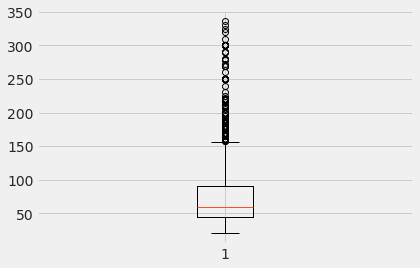

In [53]:
plt.boxplot(y_train)

In [54]:
yui= y_test.copy()

In [55]:
fig = px.scatter(x=y_train, y=xgb_train_pred, labels={'x': 'ground truth', 'y': 'prediction'})
fig.add_shape(
    type="line", line=dict(dash='dash'),
    x0=y_test.min(), y0=y_test.min(),
    x1=y_test.max(), y1=y_test.max()
)
fig.show()

## RandomForestRegressor

In [56]:
model = RandomForestRegressor()
#transforming target variable through quantile transformer
ttr = TransformedTargetRegressor(regressor=model, transformer=QuantileTransformer(output_distribution='normal'))
ttr.fit(X_train, y_train)
yhat = ttr.predict(X_test)

In [57]:
fig = px.scatter(x=y_test, y=yhat, labels={'x': 'ground truth', 'y': 'prediction'})
fig.add_shape(
    type="line", line=dict(dash='dash'),
    x0=y_test.min(), y0=y_test.min(),
    x1=y_test.max(), y1=y_test.max()
)
fig.show()

## CLASSIFICATEUR ----> REGRESSION NON LINEAIRE

### Classificateur

In [58]:
df_train

,NbChambres,Capacite_accueil,Type_logement_labels,type_propriete_labels,Desc_pre,Reg_pre,Titre_pre,PrixNuitee
0,1.0,2.0,2,0,910.782082,9.899495,1.732051,71.0
1,1.0,2.0,1,9,860.016279,17.262677,2.236068,75.0
2,2.0,4.0,2,0,2818.935792,65.276336,0.000000,155.0
3,1.0,4.0,2,0,2359.983686,50.803543,3.162278,80.0
4,1.0,2.0,2,0,2994.063961,66.068147,0.000000,120.0
5,1.0,3.0,2,0,3950.575907,69.036222,0.000000,140.0
6,2.0,6.0,2,0,3582.616362,73.559500,0.000000,159.0
7,0.0,3.0,2,0,3634.640835,70.256672,6.557439,55.0
8,1.0,2.0,1,3,5104.817137,51.439285,6.082763,155.0
9,1.0,2.0,1,3,5039.130977,51.439285,6.082763,145.0


In [62]:
# 2 classes <100 , >100 

df_train['classes'] = (df['PrixNuitee']>100)

<ipython-input-62-816e826096cc>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [63]:
df_train

,NbChambres,Capacite_accueil,Type_logement_labels,type_propriete_labels,Desc_pre,Reg_pre,Titre_pre,PrixNuitee,classes
0,1.0,2.0,2,0,910.782082,9.899495,1.732051,71.0,False
1,1.0,2.0,1,9,860.016279,17.262677,2.236068,75.0,False
2,2.0,4.0,2,0,2818.935792,65.276336,0.000000,155.0,False
3,1.0,4.0,2,0,2359.983686,50.803543,3.162278,80.0,True
4,1.0,2.0,2,0,2994.063961,66.068147,0.000000,120.0,False
5,1.0,3.0,2,0,3950.575907,69.036222,0.000000,140.0,True
6,2.0,6.0,2,0,3582.616362,73.559500,0.000000,159.0,True
7,0.0,3.0,2,0,3634.640835,70.256672,6.557439,55.0,True
8,1.0,2.0,1,3,5104.817137,51.439285,6.082763,155.0,False
9,1.0,2.0,1,3,5039.130977,51.439285,6.082763,145.0,True


In [64]:
clf_model = DecisionTreeClassifier(criterion="gini", random_state=42,max_depth=5, min_samples_leaf=5)   


In [65]:
X_class = df_train.drop(['PrixNuitee','classes'],axis=1)
y_class = df_train['classes']
X_train_class, X_test_class, y_train_class, y_test_class = train_test_split(X_class, y_class,random_state=1, test_size=0.05)

In [66]:
clf_model.fit(X_train_class,y_train_class)

DecisionTreeClassifier(max_depth=5, min_samples_leaf=5, random_state=42)

In [67]:
y_predict_class = clf_model.predict(X_test_class)

In [68]:
accuracy_score(y_test_class,y_predict_class)

0.7803468208092486

In [69]:
y_class_pre = clf_model.predict(X_class)

In [70]:
accuracy_score(y_class,y_class_pre)

0.8240579710144927

In [71]:
y_class_pre
df_train['predictedClass'] = y_class_pre

### Regressor One: <100

In [72]:
df_train_1 = df_train[df_train['predictedClass']==False]

In [73]:
accuracy_score(df_train_1.classes,df_train_1.predictedClass)

0.8239743962758219

In [74]:
df_train_1

,NbChambres,Capacite_accueil,Type_logement_labels,type_propriete_labels,Desc_pre,Reg_pre,Titre_pre,PrixNuitee,classes,predictedClass
0,1.0,2.0,2,0,910.782082,9.899495,1.732051,71.0,False,False
1,1.0,2.0,1,9,860.016279,17.262677,2.236068,75.0,False,False
2,2.0,4.0,2,0,2818.935792,65.276336,0.000000,155.0,False,False
3,1.0,4.0,2,0,2359.983686,50.803543,3.162278,80.0,True,False
4,1.0,2.0,2,0,2994.063961,66.068147,0.000000,120.0,False,False
5,1.0,3.0,2,0,3950.575907,69.036222,0.000000,140.0,True,False
6,2.0,6.0,2,0,3582.616362,73.559500,0.000000,159.0,True,False
7,0.0,3.0,2,0,3634.640835,70.256672,6.557439,55.0,True,False
8,1.0,2.0,1,3,5104.817137,51.439285,6.082763,155.0,False,False
9,1.0,2.0,1,3,5039.130977,51.439285,6.082763,145.0,True,False


In [75]:
X_1 = df_train_1.drop(['PrixNuitee','classes','predictedClass'],axis=1)
y_1 = df_train_1['PrixNuitee']
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X_1, y_1,random_state=1, test_size=0.05)

In [76]:
model_xgb.fit(X_train_1, y_train_1)
xgb_train_pred_1 = model_xgb.predict(X_train_1)
xgb_test_pred_1 = model_xgb.predict(X_test_1)


[14:56:07] WARNING: ../src/learner.cc:541: 
Parameters: { bagging_fraction, bagging_freq, bagging_seed, boosting, feature_fraction, lambda_l1, metric, min_child_samples, min_data_in_leaf, num_leaves, objectivce } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:56:07] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 90 extra nodes, 0 pruned nodes, max_depth=12
[14:56:07] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 78 extra nodes, 0 pruned nodes, max_depth=10
[14:56:07] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 138 extra nodes, 0 pruned nodes, max_depth=18
[14:56:07] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 134 extra nodes, 0 pruned nodes, max_depth=13
[14:56:07] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1

[14:56:07] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2286 extra nodes, 0 pruned nodes, max_depth=29
[14:56:07] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2418 extra nodes, 0 pruned nodes, max_depth=29
[14:56:07] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2334 extra nodes, 0 pruned nodes, max_depth=36
[14:56:07] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1704 extra nodes, 0 pruned nodes, max_depth=24
[14:56:07] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2430 extra nodes, 0 pruned nodes, max_depth=28
[14:56:07] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2404 extra nodes, 0 pruned nodes, max_depth=26
[14:56:07] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2416 extra nodes, 0 pruned nodes, max_depth=28
[14:56:07] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2466 extra nodes, 0 pruned nodes, max_depth=29
[14:56:07] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 251

[14:56:08] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2708 extra nodes, 0 pruned nodes, max_depth=32
[14:56:08] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2368 extra nodes, 0 pruned nodes, max_depth=28
[14:56:08] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2706 extra nodes, 0 pruned nodes, max_depth=35
[14:56:08] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2688 extra nodes, 0 pruned nodes, max_depth=28
[14:56:08] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2650 extra nodes, 0 pruned nodes, max_depth=29
[14:56:08] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2850 extra nodes, 0 pruned nodes, max_depth=34
[14:56:08] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2820 extra nodes, 0 pruned nodes, max_depth=36
[14:56:08] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2674 extra nodes, 0 pruned nodes, max_depth=37
[14:56:08] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 273

[14:56:09] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2886 extra nodes, 0 pruned nodes, max_depth=35
[14:56:09] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2848 extra nodes, 0 pruned nodes, max_depth=38
[14:56:09] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2766 extra nodes, 0 pruned nodes, max_depth=30
[14:56:09] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2822 extra nodes, 0 pruned nodes, max_depth=29
[14:56:09] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3014 extra nodes, 0 pruned nodes, max_depth=37
[14:56:09] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2770 extra nodes, 0 pruned nodes, max_depth=35
[14:56:09] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2764 extra nodes, 0 pruned nodes, max_depth=35
[14:56:09] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2904 extra nodes, 0 pruned nodes, max_depth=29
[14:56:09] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 291

[14:56:10] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2914 extra nodes, 0 pruned nodes, max_depth=32
[14:56:10] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2792 extra nodes, 0 pruned nodes, max_depth=28
[14:56:10] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2786 extra nodes, 0 pruned nodes, max_depth=40
[14:56:10] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2874 extra nodes, 0 pruned nodes, max_depth=34
[14:56:10] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2820 extra nodes, 0 pruned nodes, max_depth=40
[14:56:10] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2862 extra nodes, 0 pruned nodes, max_depth=36
[14:56:10] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2468 extra nodes, 0 pruned nodes, max_depth=35
[14:56:11] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2848 extra nodes, 0 pruned nodes, max_depth=36
[14:56:11] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 286

[14:56:11] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2828 extra nodes, 0 pruned nodes, max_depth=39
[14:56:11] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3006 extra nodes, 0 pruned nodes, max_depth=33
[14:56:11] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2762 extra nodes, 0 pruned nodes, max_depth=33
[14:56:12] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2844 extra nodes, 0 pruned nodes, max_depth=40
[14:56:12] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2934 extra nodes, 0 pruned nodes, max_depth=34
[14:56:12] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2906 extra nodes, 0 pruned nodes, max_depth=35
[14:56:12] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2866 extra nodes, 0 pruned nodes, max_depth=35
[14:56:12] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2942 extra nodes, 0 pruned nodes, max_depth=31
[14:56:12] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 281

[14:56:13] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2922 extra nodes, 0 pruned nodes, max_depth=33
[14:56:13] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3002 extra nodes, 0 pruned nodes, max_depth=35
[14:56:13] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2464 extra nodes, 0 pruned nodes, max_depth=27
[14:56:13] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2844 extra nodes, 0 pruned nodes, max_depth=40
[14:56:13] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2922 extra nodes, 0 pruned nodes, max_depth=40
[14:56:13] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2838 extra nodes, 0 pruned nodes, max_depth=34
[14:56:13] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3030 extra nodes, 0 pruned nodes, max_depth=38
[14:56:13] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2934 extra nodes, 0 pruned nodes, max_depth=39
[14:56:13] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 299

[14:56:14] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2950 extra nodes, 0 pruned nodes, max_depth=40
[14:56:14] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2912 extra nodes, 0 pruned nodes, max_depth=36
[14:56:14] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3072 extra nodes, 0 pruned nodes, max_depth=38
[14:56:14] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2868 extra nodes, 0 pruned nodes, max_depth=40
[14:56:14] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3092 extra nodes, 0 pruned nodes, max_depth=35
[14:56:14] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3088 extra nodes, 0 pruned nodes, max_depth=38
[14:56:14] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3008 extra nodes, 0 pruned nodes, max_depth=29
[14:56:14] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2964 extra nodes, 0 pruned nodes, max_depth=30
[14:56:14] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 297

[14:56:15] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3072 extra nodes, 0 pruned nodes, max_depth=35
[14:56:15] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2826 extra nodes, 0 pruned nodes, max_depth=40
[14:56:15] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2964 extra nodes, 0 pruned nodes, max_depth=33
[14:56:15] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2980 extra nodes, 0 pruned nodes, max_depth=32
[14:56:15] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2824 extra nodes, 0 pruned nodes, max_depth=40
[14:56:15] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2864 extra nodes, 0 pruned nodes, max_depth=40
[14:56:15] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2618 extra nodes, 0 pruned nodes, max_depth=38
[14:56:15] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2984 extra nodes, 0 pruned nodes, max_depth=39
[14:56:15] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 254

[14:56:16] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2924 extra nodes, 0 pruned nodes, max_depth=35
[14:56:16] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2888 extra nodes, 0 pruned nodes, max_depth=36
[14:56:16] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2960 extra nodes, 0 pruned nodes, max_depth=40
[14:56:16] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 3010 extra nodes, 0 pruned nodes, max_depth=33
[14:56:16] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2926 extra nodes, 0 pruned nodes, max_depth=40
[14:56:16] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2478 extra nodes, 0 pruned nodes, max_depth=36
[14:56:16] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2996 extra nodes, 0 pruned nodes, max_depth=34
[14:56:16] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2840 extra nodes, 0 pruned nodes, max_depth=38
[14:56:16] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 291

[14:56:17] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2684 extra nodes, 0 pruned nodes, max_depth=36
[14:56:17] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2714 extra nodes, 0 pruned nodes, max_depth=35
[14:56:17] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2792 extra nodes, 0 pruned nodes, max_depth=40
[14:56:17] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2710 extra nodes, 0 pruned nodes, max_depth=34
[14:56:17] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2644 extra nodes, 0 pruned nodes, max_depth=40
[14:56:17] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2756 extra nodes, 0 pruned nodes, max_depth=35
[14:56:17] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2874 extra nodes, 0 pruned nodes, max_depth=36
[14:56:17] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2662 extra nodes, 0 pruned nodes, max_depth=40
[14:56:17] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 267

[14:56:18] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2398 extra nodes, 0 pruned nodes, max_depth=32
[14:56:18] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2294 extra nodes, 0 pruned nodes, max_depth=30
[14:56:18] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2466 extra nodes, 0 pruned nodes, max_depth=36
[14:56:18] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2398 extra nodes, 0 pruned nodes, max_depth=32
[14:56:18] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2448 extra nodes, 0 pruned nodes, max_depth=40
[14:56:18] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2412 extra nodes, 0 pruned nodes, max_depth=36
[14:56:18] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2190 extra nodes, 0 pruned nodes, max_depth=32
[14:56:18] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2342 extra nodes, 0 pruned nodes, max_depth=38
[14:56:18] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 219

[14:56:19] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1882 extra nodes, 0 pruned nodes, max_depth=37
[14:56:19] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1750 extra nodes, 0 pruned nodes, max_depth=32
[14:56:19] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1348 extra nodes, 0 pruned nodes, max_depth=34
[14:56:19] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1868 extra nodes, 0 pruned nodes, max_depth=38
[14:56:19] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1756 extra nodes, 0 pruned nodes, max_depth=29
[14:56:19] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1736 extra nodes, 0 pruned nodes, max_depth=33
[14:56:19] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1852 extra nodes, 0 pruned nodes, max_depth=33
[14:56:19] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1806 extra nodes, 0 pruned nodes, max_depth=33
[14:56:19] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 174

[14:56:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1228 extra nodes, 0 pruned nodes, max_depth=35
[14:56:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1208 extra nodes, 0 pruned nodes, max_depth=32
[14:56:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1138 extra nodes, 0 pruned nodes, max_depth=34
[14:56:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 830 extra nodes, 0 pruned nodes, max_depth=22
[14:56:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1212 extra nodes, 0 pruned nodes, max_depth=31
[14:56:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 712 extra nodes, 0 pruned nodes, max_depth=21
[14:56:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1184 extra nodes, 0 pruned nodes, max_depth=34
[14:56:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1212 extra nodes, 0 pruned nodes, max_depth=27
[14:56:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 1140 

[14:56:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 916 extra nodes, 0 pruned nodes, max_depth=31
[14:56:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 796 extra nodes, 0 pruned nodes, max_depth=27
[14:56:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 786 extra nodes, 0 pruned nodes, max_depth=25
[14:56:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 820 extra nodes, 0 pruned nodes, max_depth=30
[14:56:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 796 extra nodes, 0 pruned nodes, max_depth=26
[14:56:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 682 extra nodes, 0 pruned nodes, max_depth=25
[14:56:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 680 extra nodes, 0 pruned nodes, max_depth=25
[14:56:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 684 extra nodes, 0 pruned nodes, max_depth=23
[14:56:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 628 extra n

[14:56:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 312 extra nodes, 0 pruned nodes, max_depth=15
[14:56:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 318 extra nodes, 0 pruned nodes, max_depth=15
[14:56:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 418 extra nodes, 0 pruned nodes, max_depth=23
[14:56:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 354 extra nodes, 0 pruned nodes, max_depth=15
[14:56:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 378 extra nodes, 0 pruned nodes, max_depth=22
[14:56:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 416 extra nodes, 0 pruned nodes, max_depth=25
[14:56:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 388 extra nodes, 0 pruned nodes, max_depth=23
[14:56:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 314 extra nodes, 0 pruned nodes, max_depth=19
[14:56:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 212 extra n

[14:56:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 346 extra nodes, 0 pruned nodes, max_depth=17
[14:56:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 372 extra nodes, 0 pruned nodes, max_depth=16
[14:56:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 324 extra nodes, 0 pruned nodes, max_depth=16
[14:56:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 218 extra nodes, 0 pruned nodes, max_depth=17
[14:56:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 286 extra nodes, 0 pruned nodes, max_depth=16
[14:56:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 352 extra nodes, 0 pruned nodes, max_depth=21
[14:56:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 264 extra nodes, 0 pruned nodes, max_depth=14
[14:56:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 346 extra nodes, 0 pruned nodes, max_depth=21
[14:56:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 200 extra n

[14:56:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 202 extra nodes, 0 pruned nodes, max_depth=14
[14:56:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 186 extra nodes, 0 pruned nodes, max_depth=15
[14:56:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 222 extra nodes, 0 pruned nodes, max_depth=15
[14:56:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 202 extra nodes, 0 pruned nodes, max_depth=12
[14:56:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 298 extra nodes, 0 pruned nodes, max_depth=16
[14:56:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 238 extra nodes, 0 pruned nodes, max_depth=16
[14:56:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 224 extra nodes, 0 pruned nodes, max_depth=16
[14:56:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 176 extra nodes, 0 pruned nodes, max_depth=14
[14:56:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 146 extra n

[14:56:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 360 extra nodes, 0 pruned nodes, max_depth=19
[14:56:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 180 extra nodes, 0 pruned nodes, max_depth=13
[14:56:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 158 extra nodes, 0 pruned nodes, max_depth=12
[14:56:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 208 extra nodes, 0 pruned nodes, max_depth=13
[14:56:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 306 extra nodes, 0 pruned nodes, max_depth=19
[14:56:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 282 extra nodes, 0 pruned nodes, max_depth=17
[14:56:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 174 extra nodes, 0 pruned nodes, max_depth=12
[14:56:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 198 extra nodes, 0 pruned nodes, max_depth=14
[14:56:23] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 322 extra n

[14:56:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 158 extra nodes, 0 pruned nodes, max_depth=15
[14:56:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 132 extra nodes, 0 pruned nodes, max_depth=11
[14:56:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 142 extra nodes, 0 pruned nodes, max_depth=11
[14:56:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 242 extra nodes, 0 pruned nodes, max_depth=14
[14:56:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 134 extra nodes, 0 pruned nodes, max_depth=12
[14:56:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 134 extra nodes, 0 pruned nodes, max_depth=14
[14:56:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 214 extra nodes, 0 pruned nodes, max_depth=13
[14:56:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 104 extra nodes, 0 pruned nodes, max_depth=10
[14:56:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 208 extra n

[14:56:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 298 extra nodes, 0 pruned nodes, max_depth=20
[14:56:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 200 extra nodes, 0 pruned nodes, max_depth=14
[14:56:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 232 extra nodes, 0 pruned nodes, max_depth=16
[14:56:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 278 extra nodes, 0 pruned nodes, max_depth=16
[14:56:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 222 extra nodes, 0 pruned nodes, max_depth=17
[14:56:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 204 extra nodes, 0 pruned nodes, max_depth=14
[14:56:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 256 extra nodes, 0 pruned nodes, max_depth=16
[14:56:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 172 extra nodes, 0 pruned nodes, max_depth=13
[14:56:24] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 180 extra n

[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 206 extra nodes, 0 pruned nodes, max_depth=14
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 248 extra nodes, 0 pruned nodes, max_depth=19
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 274 extra nodes, 0 pruned nodes, max_depth=17
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 198 extra nodes, 0 pruned nodes, max_depth=14
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 192 extra nodes, 0 pruned nodes, max_depth=13
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 230 extra nodes, 0 pruned nodes, max_depth=14
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 298 extra nodes, 0 pruned nodes, max_depth=16
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 182 extra nodes, 0 pruned nodes, max_depth=12
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 168 extra n

[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 284 extra nodes, 0 pruned nodes, max_depth=17
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 302 extra nodes, 0 pruned nodes, max_depth=18
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 186 extra nodes, 0 pruned nodes, max_depth=11
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 276 extra nodes, 0 pruned nodes, max_depth=16
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 156 extra nodes, 0 pruned nodes, max_depth=17
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 238 extra nodes, 0 pruned nodes, max_depth=17
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 226 extra nodes, 0 pruned nodes, max_depth=13
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 294 extra nodes, 0 pruned nodes, max_depth=12
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 176 extra n

[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 146 extra nodes, 0 pruned nodes, max_depth=11
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 146 extra nodes, 0 pruned nodes, max_depth=12
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 128 extra nodes, 0 pruned nodes, max_depth=12
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 164 extra nodes, 0 pruned nodes, max_depth=16
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 134 extra nodes, 0 pruned nodes, max_depth=14
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 88 extra nodes, 0 pruned nodes, max_depth=10
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 194 extra nodes, 0 pruned nodes, max_depth=11
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 214 extra nodes, 0 pruned nodes, max_depth=15
[14:56:25] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 130 extra no

[14:56:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 190 extra nodes, 0 pruned nodes, max_depth=18
[14:56:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 106 extra nodes, 0 pruned nodes, max_depth=9
[14:56:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 182 extra nodes, 0 pruned nodes, max_depth=14
[14:56:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 212 extra nodes, 0 pruned nodes, max_depth=16
[14:56:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 200 extra nodes, 0 pruned nodes, max_depth=13
[14:56:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 222 extra nodes, 0 pruned nodes, max_depth=20
[14:56:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 194 extra nodes, 0 pruned nodes, max_depth=23
[14:56:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 200 extra nodes, 0 pruned nodes, max_depth=16
[14:56:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 130 extra no

[14:56:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 264 extra nodes, 0 pruned nodes, max_depth=16
[14:56:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 184 extra nodes, 0 pruned nodes, max_depth=16
[14:56:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 230 extra nodes, 0 pruned nodes, max_depth=15
[14:56:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 212 extra nodes, 0 pruned nodes, max_depth=12
[14:56:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 214 extra nodes, 0 pruned nodes, max_depth=15
[14:56:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 178 extra nodes, 0 pruned nodes, max_depth=14
[14:56:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 190 extra nodes, 0 pruned nodes, max_depth=16
[14:56:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 218 extra nodes, 0 pruned nodes, max_depth=14
[14:56:26] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 190 extra n

[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 236 extra nodes, 0 pruned nodes, max_depth=15
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 298 extra nodes, 0 pruned nodes, max_depth=18
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 184 extra nodes, 0 pruned nodes, max_depth=12
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 210 extra nodes, 0 pruned nodes, max_depth=15
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 178 extra nodes, 0 pruned nodes, max_depth=11
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 298 extra nodes, 0 pruned nodes, max_depth=16
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 186 extra nodes, 0 pruned nodes, max_depth=14
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 188 extra nodes, 0 pruned nodes, max_depth=13
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 142 extra n

[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 114 extra nodes, 0 pruned nodes, max_depth=14
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 208 extra nodes, 0 pruned nodes, max_depth=12
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 178 extra nodes, 0 pruned nodes, max_depth=13
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 156 extra nodes, 0 pruned nodes, max_depth=11
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 270 extra nodes, 0 pruned nodes, max_depth=19
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 280 extra nodes, 0 pruned nodes, max_depth=17
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 226 extra nodes, 0 pruned nodes, max_depth=15
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 240 extra nodes, 0 pruned nodes, max_depth=22
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 168 extra n

[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 202 extra nodes, 0 pruned nodes, max_depth=12
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 258 extra nodes, 0 pruned nodes, max_depth=15
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 202 extra nodes, 0 pruned nodes, max_depth=13
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 284 extra nodes, 0 pruned nodes, max_depth=19
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 278 extra nodes, 0 pruned nodes, max_depth=19
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 244 extra nodes, 0 pruned nodes, max_depth=15
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 240 extra nodes, 0 pruned nodes, max_depth=13
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 242 extra nodes, 0 pruned nodes, max_depth=15
[14:56:27] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 206 extra n

[14:56:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 188 extra nodes, 0 pruned nodes, max_depth=13
[14:56:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 256 extra nodes, 0 pruned nodes, max_depth=15
[14:56:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 210 extra nodes, 0 pruned nodes, max_depth=14
[14:56:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 240 extra nodes, 0 pruned nodes, max_depth=14
[14:56:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 194 extra nodes, 0 pruned nodes, max_depth=14
[14:56:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 246 extra nodes, 0 pruned nodes, max_depth=16
[14:56:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 234 extra nodes, 0 pruned nodes, max_depth=14
[14:56:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 254 extra nodes, 0 pruned nodes, max_depth=14
[14:56:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 222 extra n

[14:56:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 258 extra nodes, 0 pruned nodes, max_depth=14
[14:56:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 328 extra nodes, 0 pruned nodes, max_depth=19
[14:56:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 236 extra nodes, 0 pruned nodes, max_depth=17
[14:56:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 258 extra nodes, 0 pruned nodes, max_depth=16
[14:56:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 222 extra nodes, 0 pruned nodes, max_depth=13
[14:56:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 216 extra nodes, 0 pruned nodes, max_depth=11
[14:56:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 146 extra nodes, 0 pruned nodes, max_depth=11
[14:56:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 212 extra nodes, 0 pruned nodes, max_depth=14
[14:56:28] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 254 extra n

[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 226 extra nodes, 0 pruned nodes, max_depth=14
[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 240 extra nodes, 0 pruned nodes, max_depth=16
[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 212 extra nodes, 0 pruned nodes, max_depth=14
[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 200 extra nodes, 0 pruned nodes, max_depth=13
[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 212 extra nodes, 0 pruned nodes, max_depth=13
[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 172 extra nodes, 0 pruned nodes, max_depth=14
[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 182 extra nodes, 0 pruned nodes, max_depth=12
[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 138 extra nodes, 0 pruned nodes, max_depth=14
[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 190 extra n

[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 204 extra nodes, 0 pruned nodes, max_depth=16
[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 356 extra nodes, 0 pruned nodes, max_depth=19
[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 176 extra nodes, 0 pruned nodes, max_depth=13
[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 238 extra nodes, 0 pruned nodes, max_depth=13
[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 330 extra nodes, 0 pruned nodes, max_depth=23
[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 244 extra nodes, 0 pruned nodes, max_depth=15
[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 214 extra nodes, 0 pruned nodes, max_depth=13
[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 194 extra nodes, 0 pruned nodes, max_depth=15
[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 248 extra n

[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 290 extra nodes, 0 pruned nodes, max_depth=18
[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 254 extra nodes, 0 pruned nodes, max_depth=18
[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 266 extra nodes, 0 pruned nodes, max_depth=17
[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 314 extra nodes, 0 pruned nodes, max_depth=19
[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 268 extra nodes, 0 pruned nodes, max_depth=16
[14:56:29] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 240 extra nodes, 0 pruned nodes, max_depth=17
[14:56:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 318 extra nodes, 0 pruned nodes, max_depth=17
[14:56:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 188 extra nodes, 0 pruned nodes, max_depth=18
[14:56:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 258 extra n

[14:56:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 228 extra nodes, 0 pruned nodes, max_depth=13
[14:56:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 194 extra nodes, 0 pruned nodes, max_depth=19
[14:56:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 130 extra nodes, 0 pruned nodes, max_depth=10
[14:56:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 286 extra nodes, 0 pruned nodes, max_depth=18
[14:56:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 238 extra nodes, 0 pruned nodes, max_depth=17
[14:56:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 192 extra nodes, 0 pruned nodes, max_depth=13
[14:56:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 278 extra nodes, 0 pruned nodes, max_depth=22
[14:56:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 192 extra nodes, 0 pruned nodes, max_depth=11
[14:56:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 284 extra n

[14:56:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 80 extra nodes, 0 pruned nodes, max_depth=10
[14:56:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 182 extra nodes, 0 pruned nodes, max_depth=15
[14:56:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 182 extra nodes, 0 pruned nodes, max_depth=14
[14:56:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 236 extra nodes, 0 pruned nodes, max_depth=17
[14:56:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 192 extra nodes, 0 pruned nodes, max_depth=17
[14:56:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 242 extra nodes, 0 pruned nodes, max_depth=18
[14:56:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 216 extra nodes, 0 pruned nodes, max_depth=16
[14:56:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 128 extra nodes, 0 pruned nodes, max_depth=12
[14:56:30] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 142 extra no

[14:56:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 116 extra nodes, 0 pruned nodes, max_depth=10
[14:56:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 102 extra nodes, 0 pruned nodes, max_depth=13
[14:56:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 138 extra nodes, 0 pruned nodes, max_depth=11
[14:56:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 156 extra nodes, 0 pruned nodes, max_depth=13
[14:56:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 244 extra nodes, 0 pruned nodes, max_depth=20
[14:56:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 270 extra nodes, 0 pruned nodes, max_depth=20
[14:56:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 164 extra nodes, 0 pruned nodes, max_depth=13
[14:56:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 224 extra nodes, 0 pruned nodes, max_depth=20
[14:56:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 168 extra n

[14:56:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 242 extra nodes, 0 pruned nodes, max_depth=14
[14:56:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 146 extra nodes, 0 pruned nodes, max_depth=11
[14:56:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 152 extra nodes, 0 pruned nodes, max_depth=12
[14:56:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 128 extra nodes, 0 pruned nodes, max_depth=11
[14:56:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 246 extra nodes, 0 pruned nodes, max_depth=15
[14:56:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 138 extra nodes, 0 pruned nodes, max_depth=11
[14:56:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 106 extra nodes, 0 pruned nodes, max_depth=11
[14:56:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 140 extra nodes, 0 pruned nodes, max_depth=12
[14:56:31] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 138 extra n

[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 148 extra nodes, 0 pruned nodes, max_depth=12
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 164 extra nodes, 0 pruned nodes, max_depth=12
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 128 extra nodes, 0 pruned nodes, max_depth=14
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 114 extra nodes, 0 pruned nodes, max_depth=12
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 112 extra nodes, 0 pruned nodes, max_depth=11
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 134 extra nodes, 0 pruned nodes, max_depth=14
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 116 extra nodes, 0 pruned nodes, max_depth=12
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 116 extra nodes, 0 pruned nodes, max_depth=12
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 114 extra n

[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 250 extra nodes, 0 pruned nodes, max_depth=14
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 114 extra nodes, 0 pruned nodes, max_depth=12
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 234 extra nodes, 0 pruned nodes, max_depth=23
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 262 extra nodes, 0 pruned nodes, max_depth=18
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 134 extra nodes, 0 pruned nodes, max_depth=16
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 128 extra nodes, 0 pruned nodes, max_depth=9
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 216 extra nodes, 0 pruned nodes, max_depth=16
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 252 extra nodes, 0 pruned nodes, max_depth=19
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 170 extra no

[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 148 extra nodes, 0 pruned nodes, max_depth=12
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 188 extra nodes, 0 pruned nodes, max_depth=15
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 120 extra nodes, 0 pruned nodes, max_depth=12
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 210 extra nodes, 0 pruned nodes, max_depth=13
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 278 extra nodes, 0 pruned nodes, max_depth=16
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 210 extra nodes, 0 pruned nodes, max_depth=16
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 226 extra nodes, 0 pruned nodes, max_depth=22
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 182 extra nodes, 0 pruned nodes, max_depth=15
[14:56:32] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 160 extra n

[14:56:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 148 extra nodes, 0 pruned nodes, max_depth=13
[14:56:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 200 extra nodes, 0 pruned nodes, max_depth=12
[14:56:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 250 extra nodes, 0 pruned nodes, max_depth=18
[14:56:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 220 extra nodes, 0 pruned nodes, max_depth=18
[14:56:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 176 extra nodes, 0 pruned nodes, max_depth=16
[14:56:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 180 extra nodes, 0 pruned nodes, max_depth=11
[14:56:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 252 extra nodes, 0 pruned nodes, max_depth=15
[14:56:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 176 extra nodes, 0 pruned nodes, max_depth=13
[14:56:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 202 extra n

[14:56:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 188 extra nodes, 0 pruned nodes, max_depth=14
[14:56:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 242 extra nodes, 0 pruned nodes, max_depth=18
[14:56:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 180 extra nodes, 0 pruned nodes, max_depth=11
[14:56:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 184 extra nodes, 0 pruned nodes, max_depth=17
[14:56:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 140 extra nodes, 0 pruned nodes, max_depth=11
[14:56:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 196 extra nodes, 0 pruned nodes, max_depth=15
[14:56:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 206 extra nodes, 0 pruned nodes, max_depth=14
[14:56:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 146 extra nodes, 0 pruned nodes, max_depth=16
[14:56:33] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 172 extra n

[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 196 extra nodes, 0 pruned nodes, max_depth=14
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 130 extra nodes, 0 pruned nodes, max_depth=9
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 148 extra nodes, 0 pruned nodes, max_depth=13
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 184 extra nodes, 0 pruned nodes, max_depth=11
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 196 extra nodes, 0 pruned nodes, max_depth=15
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 144 extra nodes, 0 pruned nodes, max_depth=14
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 230 extra nodes, 0 pruned nodes, max_depth=17
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 166 extra nodes, 0 pruned nodes, max_depth=14
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 124 extra no

[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 144 extra nodes, 0 pruned nodes, max_depth=12
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 128 extra nodes, 0 pruned nodes, max_depth=14
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 128 extra nodes, 0 pruned nodes, max_depth=12
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 122 extra nodes, 0 pruned nodes, max_depth=12
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 138 extra nodes, 0 pruned nodes, max_depth=12
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 216 extra nodes, 0 pruned nodes, max_depth=15
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 124 extra nodes, 0 pruned nodes, max_depth=12
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 178 extra nodes, 0 pruned nodes, max_depth=16
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 198 extra n

[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 234 extra nodes, 0 pruned nodes, max_depth=15
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 256 extra nodes, 0 pruned nodes, max_depth=15
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 222 extra nodes, 0 pruned nodes, max_depth=22
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 178 extra nodes, 0 pruned nodes, max_depth=14
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 232 extra nodes, 0 pruned nodes, max_depth=18
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 212 extra nodes, 0 pruned nodes, max_depth=14
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 182 extra nodes, 0 pruned nodes, max_depth=14
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 198 extra nodes, 0 pruned nodes, max_depth=14
[14:56:34] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 124 extra n

[14:56:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 252 extra nodes, 0 pruned nodes, max_depth=22
[14:56:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 274 extra nodes, 0 pruned nodes, max_depth=16
[14:56:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 184 extra nodes, 0 pruned nodes, max_depth=13
[14:56:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 250 extra nodes, 0 pruned nodes, max_depth=15
[14:56:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 182 extra nodes, 0 pruned nodes, max_depth=15
[14:56:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 274 extra nodes, 0 pruned nodes, max_depth=16
[14:56:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 220 extra nodes, 0 pruned nodes, max_depth=14
[14:56:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 210 extra nodes, 0 pruned nodes, max_depth=15
[14:56:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 222 extra n

[14:56:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 256 extra nodes, 0 pruned nodes, max_depth=19
[14:56:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 196 extra nodes, 0 pruned nodes, max_depth=17
[14:56:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 202 extra nodes, 0 pruned nodes, max_depth=11
[14:56:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 274 extra nodes, 0 pruned nodes, max_depth=16
[14:56:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 196 extra nodes, 0 pruned nodes, max_depth=14
[14:56:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 196 extra nodes, 0 pruned nodes, max_depth=13
[14:56:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 162 extra nodes, 0 pruned nodes, max_depth=13
[14:56:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 190 extra nodes, 0 pruned nodes, max_depth=14
[14:56:35] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 248 extra n

[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 266 extra nodes, 0 pruned nodes, max_depth=14
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 206 extra nodes, 0 pruned nodes, max_depth=12
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 252 extra nodes, 0 pruned nodes, max_depth=17
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 296 extra nodes, 0 pruned nodes, max_depth=19
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 190 extra nodes, 0 pruned nodes, max_depth=14
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 244 extra nodes, 0 pruned nodes, max_depth=20
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 246 extra nodes, 0 pruned nodes, max_depth=14
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 196 extra nodes, 0 pruned nodes, max_depth=12
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 262 extra n

[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 248 extra nodes, 0 pruned nodes, max_depth=16
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 194 extra nodes, 0 pruned nodes, max_depth=10
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 194 extra nodes, 0 pruned nodes, max_depth=20
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 186 extra nodes, 0 pruned nodes, max_depth=12
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 216 extra nodes, 0 pruned nodes, max_depth=13
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 160 extra nodes, 0 pruned nodes, max_depth=12
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 188 extra nodes, 0 pruned nodes, max_depth=13
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 218 extra nodes, 0 pruned nodes, max_depth=14
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 166 extra n

[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 178 extra nodes, 0 pruned nodes, max_depth=14
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 170 extra nodes, 0 pruned nodes, max_depth=13
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 176 extra nodes, 0 pruned nodes, max_depth=13
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 190 extra nodes, 0 pruned nodes, max_depth=15
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 248 extra nodes, 0 pruned nodes, max_depth=17
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 178 extra nodes, 0 pruned nodes, max_depth=13
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 210 extra nodes, 0 pruned nodes, max_depth=13
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 150 extra nodes, 0 pruned nodes, max_depth=11
[14:56:36] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 160 extra n

[14:56:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 168 extra nodes, 0 pruned nodes, max_depth=15
[14:56:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 182 extra nodes, 0 pruned nodes, max_depth=11
[14:56:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 208 extra nodes, 0 pruned nodes, max_depth=15
[14:56:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 222 extra nodes, 0 pruned nodes, max_depth=18
[14:56:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 180 extra nodes, 0 pruned nodes, max_depth=12
[14:56:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 108 extra nodes, 0 pruned nodes, max_depth=15
[14:56:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 132 extra nodes, 0 pruned nodes, max_depth=14
[14:56:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 140 extra nodes, 0 pruned nodes, max_depth=14
[14:56:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 224 extra n

[14:56:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 126 extra nodes, 0 pruned nodes, max_depth=11
[14:56:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 162 extra nodes, 0 pruned nodes, max_depth=12
[14:56:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 174 extra nodes, 0 pruned nodes, max_depth=15
[14:56:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 144 extra nodes, 0 pruned nodes, max_depth=13
[14:56:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 186 extra nodes, 0 pruned nodes, max_depth=15
[14:56:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 152 extra nodes, 0 pruned nodes, max_depth=11
[14:56:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 212 extra nodes, 0 pruned nodes, max_depth=20
[14:56:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 228 extra nodes, 0 pruned nodes, max_depth=16
[14:56:37] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 182 extra n

[14:56:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 160 extra nodes, 0 pruned nodes, max_depth=11
[14:56:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 182 extra nodes, 0 pruned nodes, max_depth=15
[14:56:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 166 extra nodes, 0 pruned nodes, max_depth=14
[14:56:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 238 extra nodes, 0 pruned nodes, max_depth=16
[14:56:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 296 extra nodes, 0 pruned nodes, max_depth=18
[14:56:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 306 extra nodes, 0 pruned nodes, max_depth=17
[14:56:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 250 extra nodes, 0 pruned nodes, max_depth=18
[14:56:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 270 extra nodes, 0 pruned nodes, max_depth=14
[14:56:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 166 extra n

[14:56:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 272 extra nodes, 0 pruned nodes, max_depth=21
[14:56:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 162 extra nodes, 0 pruned nodes, max_depth=12
[14:56:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 132 extra nodes, 0 pruned nodes, max_depth=10
[14:56:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 208 extra nodes, 0 pruned nodes, max_depth=13
[14:56:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 174 extra nodes, 0 pruned nodes, max_depth=13
[14:56:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 178 extra nodes, 0 pruned nodes, max_depth=15
[14:56:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 244 extra nodes, 0 pruned nodes, max_depth=19
[14:56:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 132 extra nodes, 0 pruned nodes, max_depth=11
[14:56:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 198 extra n

[14:56:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 160 extra nodes, 0 pruned nodes, max_depth=13
[14:56:38] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 258 extra nodes, 0 pruned nodes, max_depth=13
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 208 extra nodes, 0 pruned nodes, max_depth=14
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 204 extra nodes, 0 pruned nodes, max_depth=12
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 182 extra nodes, 0 pruned nodes, max_depth=15
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 226 extra nodes, 0 pruned nodes, max_depth=14
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 300 extra nodes, 0 pruned nodes, max_depth=17
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 284 extra nodes, 0 pruned nodes, max_depth=14
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 150 extra n

[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 216 extra nodes, 0 pruned nodes, max_depth=13
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 198 extra nodes, 0 pruned nodes, max_depth=16
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 178 extra nodes, 0 pruned nodes, max_depth=11
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 240 extra nodes, 0 pruned nodes, max_depth=15
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 172 extra nodes, 0 pruned nodes, max_depth=11
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 260 extra nodes, 0 pruned nodes, max_depth=14
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 178 extra nodes, 0 pruned nodes, max_depth=13
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 164 extra nodes, 0 pruned nodes, max_depth=14
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 202 extra n

[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 224 extra nodes, 0 pruned nodes, max_depth=13
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 190 extra nodes, 0 pruned nodes, max_depth=24
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 164 extra nodes, 0 pruned nodes, max_depth=12
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 176 extra nodes, 0 pruned nodes, max_depth=15
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 158 extra nodes, 0 pruned nodes, max_depth=15
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 144 extra nodes, 0 pruned nodes, max_depth=14
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 250 extra nodes, 0 pruned nodes, max_depth=16
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 178 extra nodes, 0 pruned nodes, max_depth=12
[14:56:39] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 148 extra n

[14:56:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 148 extra nodes, 0 pruned nodes, max_depth=14
[14:56:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 168 extra nodes, 0 pruned nodes, max_depth=12
[14:56:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 216 extra nodes, 0 pruned nodes, max_depth=15
[14:56:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 120 extra nodes, 0 pruned nodes, max_depth=14
[14:56:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 154 extra nodes, 0 pruned nodes, max_depth=13
[14:56:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 276 extra nodes, 0 pruned nodes, max_depth=16
[14:56:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 236 extra nodes, 0 pruned nodes, max_depth=17
[14:56:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 136 extra nodes, 0 pruned nodes, max_depth=12
[14:56:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 284 extra n

[14:56:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 284 extra nodes, 0 pruned nodes, max_depth=19
[14:56:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 214 extra nodes, 0 pruned nodes, max_depth=14
[14:56:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 188 extra nodes, 0 pruned nodes, max_depth=11
[14:56:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 210 extra nodes, 0 pruned nodes, max_depth=17
[14:56:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 260 extra nodes, 0 pruned nodes, max_depth=17
[14:56:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 134 extra nodes, 0 pruned nodes, max_depth=13
[14:56:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 134 extra nodes, 0 pruned nodes, max_depth=14
[14:56:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 338 extra nodes, 0 pruned nodes, max_depth=22
[14:56:40] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 250 extra n

[14:56:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 170 extra nodes, 0 pruned nodes, max_depth=19
[14:56:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 138 extra nodes, 0 pruned nodes, max_depth=16
[14:56:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 172 extra nodes, 0 pruned nodes, max_depth=12
[14:56:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 250 extra nodes, 0 pruned nodes, max_depth=18
[14:56:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 308 extra nodes, 0 pruned nodes, max_depth=18
[14:56:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 154 extra nodes, 0 pruned nodes, max_depth=16
[14:56:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 146 extra nodes, 0 pruned nodes, max_depth=12
[14:56:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 212 extra nodes, 0 pruned nodes, max_depth=18
[14:56:41] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 250 extra n

In [77]:
fig = px.scatter(x=y_test_1, y=xgb_test_pred_1, labels={'x': 'ground truth', 'y': 'prediction'})
fig.add_shape(
    type="line", line=dict(dash='dash'),
    x0=y_test.min(), y0=y_test.min(),
    x1=y_test.max(), y1=y_test.max()
)
fig.show()

### Regressor >100:

In [78]:
df_train_2 = df_train[df_train['predictedClass']==True]

In [79]:
X_2 = df_train_2.drop(['PrixNuitee','classes','predictedClass'],axis=1)
y_2 = df_train_2['PrixNuitee']
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_2, y_2,random_state=1, test_size=0.05)

In [80]:
model_xgb.fit(X_train_2, y_train_2)
xgb_train_pred_2 = model_xgb.predict(X_train_2)
xgb_test_pred_2 = model_xgb.predict(X_test_2)


[14:57:20] WARNING: ../src/learner.cc:541: 
Parameters: { bagging_fraction, bagging_freq, bagging_seed, boosting, feature_fraction, lambda_l1, metric, min_child_samples, min_data_in_leaf, num_leaves, objectivce } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2 extra nodes, 0 pruned nodes, max_depth=1
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2 extra nodes, 0 pruned nodes, max_depth=1
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2 extra nodes, 0 pruned nodes, max_depth=1
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2 extra nod

[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 14 extra nodes, 0 pruned nodes, max_depth=7
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 12 extra nodes, 0 pruned nodes, max_depth=6
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 10 extra nodes, 0 pruned nodes, max_depth=3
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 16 extra nodes, 0 pruned nodes, max_depth=4
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 8 extra nodes, 0 pruned nodes, max_depth=4
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 16 extra nodes, 0 pruned nodes, max_depth=4
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 14 extra nodes, 0 pruned nodes, max_depth=6
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 10 extra nodes, 0 pruned nodes, max_depth=5
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 14 extra nodes, 0 pruned nod

[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 8 extra nodes, 0 pruned nodes, max_depth=4
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 12 extra nodes, 0 pruned nodes, max_depth=5
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 10 extra nodes, 0 pruned nodes, max_depth=4
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 8 extra nodes, 0 pruned nodes, max_depth=3
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 12 extra nodes, 0 pruned nodes, max_depth=4
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 10 extra nodes, 0 pruned nodes, max_depth=3
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 10 extra nodes, 0 pruned nodes, max_depth=5
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 6 extra nodes, 0 pruned nodes, max_depth=3
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 12 extra nodes, 0 pruned nodes

[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 12 extra nodes, 0 pruned nodes, max_depth=5
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 6 extra nodes, 0 pruned nodes, max_depth=2
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 10 extra nodes, 0 pruned nodes, max_depth=4
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 12 extra nodes, 0 pruned nodes, max_depth=4
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 10 extra nodes, 0 pruned nodes, max_depth=4
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 10 extra nodes, 0 pruned nodes, max_depth=5
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 12 extra nodes, 0 pruned nodes, max_depth=4
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 14 extra nodes, 0 pruned nodes, max_depth=6
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 12 extra nodes, 0 pruned nod

[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 14 extra nodes, 0 pruned nodes, max_depth=5
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 12 extra nodes, 0 pruned nodes, max_depth=5
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 4 extra nodes, 0 pruned nodes, max_depth=2
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 8 extra nodes, 0 pruned nodes, max_depth=4
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 8 extra nodes, 0 pruned nodes, max_depth=4
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 14 extra nodes, 0 pruned nodes, max_depth=5
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 12 extra nodes, 0 pruned nodes, max_depth=4
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 10 extra nodes, 0 pruned nodes, max_depth=4
[14:57:20] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 12 extra nodes, 0 pruned nodes

[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2 extra nodes, 0 pruned nodes, max_depth=1
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 6 extra nodes, 0 pruned nodes, max_depth=2
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2 extra nodes, 0 pruned nodes, max_depth=1
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2 extra nodes, 0 pruned nodes, max_depth=1
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2 extra nodes, 0 pruned nodes, max_

[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_

[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 2 extra nodes, 0 pruned nodes, max_depth=1
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_

[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_

[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:21] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_

[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_

[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_

[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_

[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_depth=0
[14:57:22] INFO: ../src/tree/updater_prune.cc:101: tree pruning end, 0 extra nodes, 0 pruned nodes, max_

[14:57:23] ======== Monitor: Learner ========
[14:57:23] Configure: 0.001824s, 1 calls @ 1824us

[14:57:23] EvalOneIter: 0.016368s, 5000 calls @ 16368us

[14:57:23] GetGradient: 0.171466s, 5000 calls @ 171466us

[14:57:23] PredictRaw: 0.22419s, 5000 calls @ 224190us

[14:57:23] UpdateOneIter: 2.01307s, 5000 calls @ 2013074us

[14:57:23] ======== Monitor: GBTree ========
[14:57:23] BoostNewTrees: 1.51994s, 5000 calls @ 1519941us

[14:57:23] CommitModel: 0.004421s, 5000 calls @ 4421us

[14:57:23] ======== Monitor: TreePruner ========
[14:57:23] PrunerUpdate: 0.2632s, 5000 calls @ 263200us

[14:57:23] ======== Monitor: Learner ========
[14:57:23] Configure: 0.000675s, 1 calls @ 675us

[14:57:23] ======== Monitor: GBTree ========
[14:57:23] ======== Monitor: TreePruner ========


In [81]:
fig = px.scatter(x=y_test_2, y=xgb_test_pred_2, labels={'x': 'ground truth', 'y': 'prediction'})
fig.add_shape(
    type="line", line=dict(dash='dash'),
    x0=y_test.min(), y0=y_test.min(),
    x1=y_test.max(), y1=y_test.max()
)
fig.show()

In [82]:
rmsle(y_test_1, xgb_test_pred_1)

24.366191298462624

In [83]:
y_test_all = np.array(list(y_test_1)+list(y_test_2))
y_pre_all= np.array(list(xgb_test_pred_1)+list(xgb_test_pred_2))

In [84]:
rmsle(y_test_all, y_pre_all)

24.68354388330713

In [85]:
fig = px.scatter(x=y_test_all, y=y_pre_all, labels={'x': 'ground truth', 'y': 'prediction'})
fig.add_shape(
    type="line", line=dict(dash='dash'),
    x0=y_test.min(), y0=y_test.min(),
    x1=y_test.max(), y1=y_test.max()
)
fig.show()

## Clasiication II (0.001->100)(100->200)(200->400)

In [86]:
df_train

,NbChambres,Capacite_accueil,Type_logement_labels,type_propriete_labels,Desc_pre,Reg_pre,Titre_pre,PrixNuitee,classes,predictedClass
0,1.0,2.0,2,0,910.782082,9.899495,1.732051,71.0,False,False
1,1.0,2.0,1,9,860.016279,17.262677,2.236068,75.0,False,False
2,2.0,4.0,2,0,2818.935792,65.276336,0.000000,155.0,False,False
3,1.0,4.0,2,0,2359.983686,50.803543,3.162278,80.0,True,False
4,1.0,2.0,2,0,2994.063961,66.068147,0.000000,120.0,False,False
5,1.0,3.0,2,0,3950.575907,69.036222,0.000000,140.0,True,False
6,2.0,6.0,2,0,3582.616362,73.559500,0.000000,159.0,True,False
7,0.0,3.0,2,0,3634.640835,70.256672,6.557439,55.0,True,False
8,1.0,2.0,1,3,5104.817137,51.439285,6.082763,155.0,False,False
9,1.0,2.0,1,3,5039.130977,51.439285,6.082763,145.0,True,False


In [87]:
df_train_3 = df_train.copy()

In [90]:
df_train_3.where(df_train_3['PrixNuitee']<100)['classes']=1

In [109]:
df_train_3.loc[df_train_3['PrixNuitee'] < 100,'classes']=1
df_train_3.loc[((df_train_3.PrixNuitee >= 100)) & ((df_train_3.PrixNuitee <200)),['classes']]=2
df_train_3.loc[((df_train_3.PrixNuitee >= 200)) & ((df_train_3.PrixNuitee <400)),['classes']]=3
df_train_3.loc[((df_train_3.PrixNuitee >= 400)) & ((df_train_3.PrixNuitee <600)),['classes']]=4
df_train_3.loc[((df_train_3.PrixNuitee >= 600)) & ((df_train_3.PrixNuitee <800)),['classes']]=5
df_train_3.loc[df_train_3['PrixNuitee'] >= 800,'classes']=6

In [110]:
df_train_3

,NbChambres,Capacite_accueil,Type_logement_labels,type_propriete_labels,Desc_pre,Reg_pre,Titre_pre,PrixNuitee,classes,predictedClass
0,1.0,2.0,2,0,910.782082,9.899495,1.732051,71.0,1,False
1,1.0,2.0,1,9,860.016279,17.262677,2.236068,75.0,1,False
2,2.0,4.0,2,0,2818.935792,65.276336,0.000000,155.0,2,False
3,1.0,4.0,2,0,2359.983686,50.803543,3.162278,80.0,1,False
4,1.0,2.0,2,0,2994.063961,66.068147,0.000000,120.0,2,False
5,1.0,3.0,2,0,3950.575907,69.036222,0.000000,140.0,2,False
6,2.0,6.0,2,0,3582.616362,73.559500,0.000000,159.0,2,False
7,0.0,3.0,2,0,3634.640835,70.256672,6.557439,55.0,1,False
8,1.0,2.0,1,3,5104.817137,51.439285,6.082763,155.0,2,False
9,1.0,2.0,1,3,5039.130977,51.439285,6.082763,145.0,2,False


(array([2700.,    0.,    0.,    0.,    0.,  637.,    0.,    0.,    0.,
         113.]),
 array([1.0, 1.2, 1.4, 1.6, 1.8, 2.0, 2.2, 2.4000000000000004, 2.6, 2.8,
        3.0], dtype=object),
 <BarContainer object of 10 artists>)

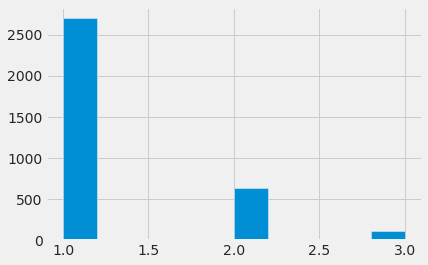

In [111]:
plt.hist(df_train_3.classes)

## HHIOHI

In [20]:
df_train = pd.read_csv('Modeles/trained_Data.csv')

df_train.loc[df_train['PrixNuitee'] < 100,'classes']=1
df_train.loc[(df_train.PrixNuitee >= 100),['classes']]=0
X = df_train.drop('PrixNuitee', axis=1)
y = df_train.PrixNuitee.astype(int)
display(df_train.sample(10))
display(X.sample(5))
display(y.sample(5))

,Unnamed: 0,Type_logement,type_propriete,PrixNuitee,NbChambres,Capacite_accueil,Desc_pre,Titre_pre,Reg_pre,classes
3386,3386,2,0,50,2,4,2126.833797,43.954522,267.652760,1.0
1131,1131,2,0,125,2,4,4019.865669,103.237590,146.003425,0.0
417,417,1,9,34,1,2,12245.071172,193.126901,405.020987,1.0
3568,3568,1,0,18,1,2,9384.077845,113.863954,796.308985,1.0
261,261,1,9,40,1,2,5921.975093,126.336851,522.301637,1.0
3266,3266,2,0,45,1,2,9129.382619,170.842032,0.000000,1.0
678,678,2,0,36,0,2,15342.217115,61.749494,748.213873,1.0
1797,1797,2,0,66,2,4,3116.371287,80.473598,146.003425,1.0
2833,2833,2,0,75,1,4,6239.035502,0.000000,97.154516,1.0
2918,2918,2,0,40,1,2,8839.475041,65.855903,1311.394677,1.0


,Unnamed: 0,Type_logement,type_propriete,NbChambres,Capacite_accueil,Desc_pre,Titre_pre,Reg_pre,classes
1175,1175,2,8,1,3,24634.602859,115.425301,990.193920,1.0
2139,2139,1,9,1,2,14328.714457,119.582607,2498.547178,1.0
1069,1069,2,0,3,6,6212.764924,95.535334,146.003425,0.0
2783,2783,2,0,2,2,3084.983468,63.427124,52.009614,1.0
3569,3569,2,0,2,4,3875.339856,77.129761,272.472017,1.0


5217    45
1685    55
5016    50
2289    60
4646    60
Name: PrixNuitee, dtype: int64

In [21]:
#df_train = pd.read_csv('./trained_Data.csv')
df_train = df_train.drop(['Unnamed: 0'],axis =1)
print(df_train.columns)
print(df_train.shape)
display(df_train.sample(10))

Index(['Type_logement', 'type_propriete', 'PrixNuitee', 'NbChambres',
       'Capacite_accueil', 'Desc_pre', 'Titre_pre', 'Reg_pre', 'classes'],
      dtype='object')
(5234, 9)


,Type_logement,type_propriete,PrixNuitee,NbChambres,Capacite_accueil,Desc_pre,Titre_pre,Reg_pre,classes
1314,2,9,800,6,8,12895.899891,57.271284,10239.184831,0.0
1024,2,0,40,2,4,7945.445928,135.066650,765.346980,1.0
4306,1,0,30,1,2,5543.005051,40.730824,78.409183,1.0
1493,2,0,72,1,3,4850.309784,144.003472,329.686214,1.0
2917,1,9,50,1,2,10567.363153,17.320508,663.437262,1.0
3110,2,0,60,1,3,322.001553,17.029386,146.003425,1.0
506,2,0,70,1,3,5539.680406,90.575935,52.009614,1.0
2578,2,0,75,1,4,7532.216805,100.314505,52.009614,1.0
1834,2,0,55,1,4,3852.446885,17.029386,146.003425,1.0
2952,1,0,40,1,2,6075.346986,162.058631,1353.197694,1.0


In [22]:
X = df_train.drop('PrixNuitee', axis=1)
y = df_train.PrixNuitee.astype(int)
display(df_train.sample(10))
display(X.sample(5))
display(y.sample(5))

,Type_logement,type_propriete,PrixNuitee,NbChambres,Capacite_accueil,Desc_pre,Titre_pre,Reg_pre,classes
780,2,0,200,2,4,2252.575859,36.013886,52.009614,0.0
2142,2,0,90,2,6,6059.475142,54.009258,238.075618,1.0
4572,2,0,150,2,5,12597.959835,49.497475,65.848311,0.0
2472,2,9,70,2,5,9518.726963,173.600115,599.945831,1.0
3920,2,0,110,2,4,5656.778147,44.124823,27.018512,0.0
4792,2,0,80,1,4,4048.434389,95.220796,58.608873,1.0
5008,2,0,40,1,4,13199.080006,165.704556,0.000000,1.0
3352,2,0,100,2,3,3817.374359,1.414214,27.018512,0.0
4226,2,0,40,1,2,6433.239542,37.013511,92.401299,1.0
1057,2,0,87,2,4,7995.960418,0.000000,146.003425,1.0


,Type_logement,type_propriete,NbChambres,Capacite_accueil,Desc_pre,Titre_pre,Reg_pre,classes
1752,2,0,1,2,3912.474025,90.620086,351.690205,1.0
4813,2,0,0,2,6303.493634,178.087057,0.000000,1.0
4004,2,0,1,3,6227.343976,38.091994,73.607065,1.0
3909,2,0,1,2,3145.890971,38.013156,1515.025412,1.0
4660,2,0,2,4,6517.375469,4.123106,78.409183,1.0


538     135
1647     99
1803     35
2017     49
3726     80
Name: PrixNuitee, dtype: int64

In [23]:
scaler = preprocessing.StandardScaler()
X[["Type_logement"]] = scaler.fit_transform(X[["Type_logement"]])
X[["type_propriete"]] = scaler.fit_transform(X[["type_propriete"]])
X[["NbChambres"]] = scaler.fit_transform(X[["NbChambres"]])
X[["Capacite_accueil"]] = scaler.fit_transform(X[["Capacite_accueil"]])
X[["Desc_pre"]] = scaler.fit_transform(X[["Desc_pre"]])
X[["Titre_pre"]] = scaler.fit_transform(X[["Titre_pre"]])
X[["Reg_pre"]] = scaler.fit_transform(X[["Reg_pre"]])
display(X.sample(10))
X.describe()

,Type_logement,type_propriete,NbChambres,Capacite_accueil,Desc_pre,Titre_pre,Reg_pre,classes
267,0.548460,2.131614,0.786106,0.991773,0.674638,-0.174606,-0.243281,0.0
1702,0.548460,-0.483277,-0.327722,0.398929,1.317669,0.366784,-0.490794,1.0
2769,0.548460,-0.483277,0.786106,0.398929,-0.724014,0.912861,-0.434619,1.0
2139,-1.663126,2.131614,-0.327722,-0.786758,1.734253,0.801857,1.640686,1.0
2448,0.548460,-0.483277,-0.327722,0.398929,-0.690715,-0.747332,-0.366240,1.0
419,0.548460,-0.483277,0.786106,1.584616,0.305471,-1.469289,0.261134,0.0
649,0.548460,-0.483277,-0.327722,0.398929,2.457459,0.752970,1.712972,1.0
4410,0.548460,2.131614,0.786106,0.398929,0.515376,1.306054,0.226717,1.0
281,-1.663126,-0.483277,-0.327722,-0.786758,-1.664349,-0.777438,-0.446425,1.0
2191,-1.663126,0.388353,-0.327722,0.398929,0.170795,0.240965,0.608851,1.0


,Type_logement,type_propriete,NbChambres,Capacite_accueil,Desc_pre,Titre_pre,Reg_pre,classes
count,5.234000e+03,5.234000e+03,5.234000e+03,5.234000e+03,5.234000e+03,5.234000e+03,5.234000e+03,5234.000000
mean,1.900573e-17,3.801146e-17,-4.887187e-17,5.973229e-17,8.688333e-17,-2.009177e-16,-4.344167e-17,0.797478
std,1.000096e+00,1.000096e+00,1.000096e+00,1.000096e+00,1.000096e+00,1.000096e+00,1.000096e+00,0.401918
min,-3.874713e+00,-4.832769e-01,-1.441549e+00,-1.379601e+00,-1.946782e+00,-1.469289e+00,-4.907938e-01,0.000000
25%,5.484599e-01,-4.832769e-01,-3.277215e-01,-7.867579e-01,-7.869324e-01,-7.596788e-01,-4.279556e-01,1.000000
50%,5.484599e-01,-4.832769e-01,-3.277215e-01,-1.939144e-01,-1.640961e-01,-1.201018e-01,-3.662400e-01,1.000000
75%,5.484599e-01,-4.832769e-01,7.861061e-01,3.989291e-01,6.782417e-01,7.338971e-01,1.645326e-01,1.000000
max,5.484599e-01,3.003245e+00,9.696727e+00,7.513051e+00,4.867480e+00,3.688644e+00,8.244130e+00,1.000000


In [24]:
from sklearn.decomposition import PCA
pca2 = PCA(n_components=2)
principalComponents2 = pca2.fit_transform(X)
principalDf2 = pd.DataFrame(data = principalComponents2, columns = ['PC 1', 'PC 2'])
display(principalDf2)

pca3 = PCA(n_components=3)
principalComponents3 = pca3.fit_transform(X)
principalDf3 = pd.DataFrame(data = principalComponents3, columns = ['PC 1', 'PC 2', 'PC 3'])
display(principalDf3)

,PC 1,PC 2
0,-1.017129,-2.421697
1,-0.994611,-0.284685
2,-0.988978,-2.349532
3,0.696334,-0.256100
4,-0.199304,-0.193386
5,-0.716290,0.045773
6,-0.286459,0.182090
7,1.480213,-0.198059
8,-1.173843,0.266787
9,-1.058523,-0.901434


,PC 1,PC 2,PC 3
0,-1.017129,-2.421697,1.029651
1,-0.994611,-0.284685,-1.464577
2,-0.988978,-2.349532,1.101807
3,0.696334,-0.256100,-1.384426
4,-0.199304,-0.193386,-1.525203
5,-0.716290,0.045773,-1.201491
6,-0.286459,0.182090,-1.158983
7,1.480213,-0.198059,-1.479004
8,-1.173843,0.266787,-1.264393
9,-1.058523,-0.901434,0.771526


In [25]:
X_train_class, X_test_class, y_train_class, y_test_class = train_test_split(X, X['classes'].values,random_state=1, test_size=0.05)

In [26]:
clf_model = DecisionTreeClassifier(criterion="gini", random_state=42,max_depth=5, min_samples_leaf=5)   
clf_model.fit(X_train_class,y_train_class)
y_predict_class = clf_model.predict(X_test_class)
accuracy_score(y_test_class,y_predict_class)

1.0